# IC3392 GAS pairwise Flux/Error cut test: same-binning 7000 reference

Redo of the 2026-05-07 pairwise GAS comparison after adding the `v3tk_v7.6.8_7000_samebinning` run.

This notebook uses the same plot structure as the 0507 test, but changes the reference run:

- x axis / reference: `v768_7000_53_samebinning`, `7.6.8 7000/53 same-bin`
- y axis / comparison: `v768_9100_40`, `7.6.8 9100/40`
- gas lines: `OIII5006`, `HA6562`, `NII6583`, `SII6716`
- each pairwise figure: 4 rows by 2 columns, with pairwise scatter on the left and residuals on the right

The first executable section verifies that the `7000_samebinning` run really uses the same binning as the `7.6.8 9100/40` run before any scientific comparison is made. Numeric `Flux/Err` cuts use strict `Flux/Err > cut` in both runs for the same gas line.


In [1]:
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from astropy.io import fits
import yaml

pd.set_option('display.max_columns', 180)
pd.set_option('display.max_rows', 260)
pd.set_option('display.max_colwidth', 180)

plt.rcParams.update({
    'figure.dpi': 130,
    'savefig.dpi': 160,
    'axes.grid': False,
})

root = Path.cwd()
GALAXY = 'IC3392'

RUNS = {
    'v768_7000_53_samebinning': {
        'label': 'v3tk_v7.6.8 7000/53 setup, rerun with the 7.6.8 9100/40 binning',
        'plot_label': '7.6.8 7000/53 same-bin',
        'gas_path': root / 'v3tk_v7.6.8_7000_samebinning' / GALAXY / f'{GALAXY}_gas_bin_maps.fits',
        'config_path': root / 'v3tk_v7.6.8_7000_samebinning' / GALAXY / f'{GALAXY}_MAUVE_MasterConfig_v7.6.8_7000_samebinning_setonix.yaml',
        'bin_path': root / 'v3tk_v7.6.8_7000_samebinning' / GALAXY / f'{GALAXY}_gas_bin_maps.fits',
        'bin_ext': 'BIN_ID',
    },
    'v768_9100_40': {
        'label': 'v3tk_v7.6.8 full red setup to 9100; VELSCALE=40',
        'plot_label': '7.6.8 9100/40',
        'gas_path': root / 'v3tk_v7.6.8_VELSCALE40' / GALAXY / f'{GALAXY}_gas_bin_maps.fits',
        'config_path': root / 'v3tk_v7.6.8_VELSCALE40' / GALAXY / f'{GALAXY}_MAUVE_MasterConfig_v7.6.8_VELSCALE40_setonix.yaml',
        'bin_path': root / 'v3tk_v7.6.8_VELSCALE40' / GALAXY / f'{GALAXY}_gas_bin_maps.fits',
        'bin_ext': 'BIN_ID',
    },
}

BASELINE_RUN = 'v768_7000_53_samebinning'
COMPARE_RUN = 'v768_9100_40'
RUN_ORDER = [BASELINE_RUN, COMPARE_RUN]

CONFIG_PATHS = {
    'old_v721_7000_53': root / 'v3_v7.2.1' / GALAXY / 'CONFIG',
    'v768_7000_53_original_binning': root / 'v3tk_v7.6.8_7000' / GALAXY / f'{GALAXY}_MAUVE_MasterConfig_v7.6.8_7000_setonix.yaml',
    BASELINE_RUN: RUNS[BASELINE_RUN]['config_path'],
    COMPARE_RUN: RUNS[COMPARE_RUN]['config_path'],
}

BINNING_REFERENCES = {
    'samebinning_7000_53_gas_BIN_ID': (RUNS[BASELINE_RUN]['bin_path'], RUNS[BASELINE_RUN]['bin_ext']),
    'v768_9100_40_gas_BIN_ID': (RUNS[COMPARE_RUN]['bin_path'], RUNS[COMPARE_RUN]['bin_ext']),
    'v768_9100_40_spatial_BINID': (root / 'v3tk_v7.6.8_VELSCALE40' / GALAXY / f'{GALAXY}_spatial_binning_maps.fits', 'BINID'),
    'v768_7000_53_original_spatial_BINID': (root / 'v3tk_v7.6.8_7000' / GALAXY / f'{GALAXY}_spatial_binning_maps.fits', 'BINID'),
    'old_v721_7000_53_spatial_BINID': (root / 'v3_v7.2.1' / GALAXY / f'{GALAXY}_SPATIAL_BINNING_maps.fits', 'BINID'),
}

LINE_SPECS = [
    ('OIII5006', 'OIII 5006'),
    ('HA6562', 'Halpha 6562'),
    ('NII6583', 'NII 6583'),
    ('SII6716', 'SII 6716'),
]
LINE_ORDER = [line for line, label in LINE_SPECS]
LINE_LABELS = dict(LINE_SPECS)

QUANTITIES = ['FLUX', 'VEL', 'SIGMA']
FLUXERR_CUTS = [0, 3, 5, 10, 20, 50]
CUT_COLORS = {
    0: '#7f7f7f',
    3: '#1f77b4',
    5: '#2ca02c',
    10: '#ff7f0e',
    20: '#9467bd',
    50: '#d62728',
}
NO_CUT_COLOR = '#1f77b4'

run_table = []
for run_key, run in RUNS.items():
    gas_path = run['gas_path']
    config_path = run['config_path']
    run_table.append({
        'run_key': run_key,
        'label': run['label'],
        'gas_path': str(gas_path.relative_to(root)),
        'gas_exists': gas_path.exists(),
        'gas_size_MB': gas_path.stat().st_size / 1024**2 if gas_path.exists() else np.nan,
        'config_path': str(config_path.relative_to(root)),
        'config_exists': config_path.exists(),
    })
run_table = pd.DataFrame(run_table)
display(run_table)

assert run_table['gas_exists'].all(), 'At least one GAS map file is missing.'
assert run_table['config_exists'].all(), 'At least one config file is missing.'


,run_key,label,gas_path,gas_exists,gas_size_MB,config_path,config_exists
0,v768_7000_53_samebinning,"v3tk_v7.6.8 7000/53 setup, rerun with the 7.6.8 9100/40 binning",v3tk_v7.6.8_7000_samebinning/IC3392/IC3392_gas_bin_maps.fits,True,152.251282,v3tk_v7.6.8_7000_samebinning/IC3392/IC3392_MAUVE_MasterConfig_v7.6.8_7000_samebinning_setonix.yaml,True
1,v768_9100_40,v3tk_v7.6.8 full red setup to 9100; VELSCALE=40,v3tk_v7.6.8_VELSCALE40/IC3392/IC3392_gas_bin_maps.fits,True,223.983765,v3tk_v7.6.8_VELSCALE40/IC3392/IC3392_MAUVE_MasterConfig_v7.6.8_VELSCALE40_setonix.yaml,True


## Verify Setup And Binning

Before comparing the maps, verify two things:

1. The `7000_samebinning` run has the expected old-style spectral setup: 4800-7000 Angstrom and `VELSCALE=53`.
2. Its `BIN_ID` map is exactly the same as the `7.6.8 9100/40` binning map. This is the key check for isolating binning effects.


,run_key,READ_DATA.LMIN_TOT,READ_DATA.LMAX_TOT,READ_DATA.LMIN_SNR,READ_DATA.LMAX_SNR,SPATIAL_MASKING.METHOD,SPATIAL_MASKING.MIN_SNR,SPATIAL_BINNING.METHOD,SPATIAL_BINNING.TARGET_SNR,PREPARE_SPECTRA.VELSCALE,KIN.LMIN,KIN.LMAX,KIN.SIGMA,KIN.ADEG,KIN.MDEG,CONT.METHOD,CONT.LMIN,CONT.LMAX,CONT.MDEG,GAS.LEVEL,GAS.LMIN,GAS.LMAX,GAS.MDEG,GAS.FIXED,GAS.MOM,GAS.EMI_FILE,GAS.LIBRARY
0,old_v721_7000_53,4800,7000,4800,7000,default,1.5,voronoi,40.0,53,4800,7000,66,12,0,ppxf,4800,7000,8,BIN,4800,7000,8,True,2,emissionLinesPHANGS.config,MILES_EMLINES/
1,v768_7000_53_original_binning,4800,7000,4800,7000,default,1.5,voronoi,40.0,53,4800,7000,66,12,0,ppxf,4800,7000,8,BIN,4800,7000,8,True,2,emissionLines_ppxf.config,MILES_EMLINES/
2,v768_7000_53_samebinning,4800,7000,4800,7000,False,1.5,False,40.0,53,4800,7000,66,12,0,False,4800,7000,8,BIN,4800,7000,8,True,2,emissionLines_ppxf.config,MILES_EMLINES/
3,v768_9100_40,4800,9100,4800,9100,default,-10.0,voronoi,40.0,40,4800,9100,82,23,0,ppxf,4800,9100,23,BOTH,4800,9100,23,True,2,emissionLines_ppxf_full.config,EMILES_baseFe_EMLINES/


,binning_key,path,extname,shape,n_finite_pixels,n_valid_pixels,n_unique_bins,min_bin_id,max_bin_id
0,samebinning_7000_53_gas_BIN_ID,v3tk_v7.6.8_7000_samebinning/IC3392/IC3392_gas_bin_maps.fits,BIN_ID,"(438, 437)",94543,94543,4032,0,4031
1,v768_9100_40_gas_BIN_ID,v3tk_v7.6.8_VELSCALE40/IC3392/IC3392_gas_bin_maps.fits,BIN_ID,"(438, 437)",94543,94543,4032,0,4031
2,v768_9100_40_spatial_BINID,v3tk_v7.6.8_VELSCALE40/IC3392/IC3392_spatial_binning_maps.fits,BINID,"(438, 437)",94543,94543,4032,0,4031
3,v768_7000_53_original_spatial_BINID,v3tk_v7.6.8_7000/IC3392/IC3392_spatial_binning_maps.fits,BINID,"(438, 437)",72336,72336,3714,0,3713
4,old_v721_7000_53_spatial_BINID,v3_v7.2.1/IC3392/IC3392_SPATIAL_BINNING_maps.fits,BINID,"(438, 437)",73168,73168,4077,0,4076


,baseline,comparison,same_shape,exact_equal_including_nan,finite_pixels_in_both,n_finite_mismatches
0,samebinning_7000_53_gas_BIN_ID,v768_9100_40_gas_BIN_ID,True,True,94543,0
1,samebinning_7000_53_gas_BIN_ID,v768_9100_40_spatial_BINID,True,True,94543,0
2,samebinning_7000_53_gas_BIN_ID,v768_7000_53_original_spatial_BINID,True,False,72080,72069
3,samebinning_7000_53_gas_BIN_ID,old_v721_7000_53_spatial_BINID,True,False,72910,72892


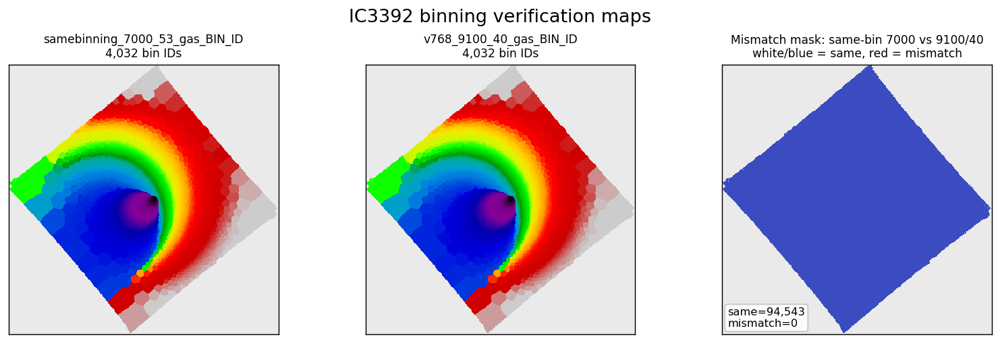

In [2]:
def load_config(path):
    with open(path, 'r') as handle:
        return yaml.safe_load(handle)


def config_value(config, dotted_key):
    value = config
    for key in dotted_key.split('.'):
        if not isinstance(value, dict) or key not in value:
            return np.nan
        value = value[key]
    return value


CONFIG_FIELDS = [
    'READ_DATA.LMIN_TOT',
    'READ_DATA.LMAX_TOT',
    'READ_DATA.LMIN_SNR',
    'READ_DATA.LMAX_SNR',
    'SPATIAL_MASKING.METHOD',
    'SPATIAL_MASKING.MIN_SNR',
    'SPATIAL_BINNING.METHOD',
    'SPATIAL_BINNING.TARGET_SNR',
    'PREPARE_SPECTRA.VELSCALE',
    'KIN.LMIN',
    'KIN.LMAX',
    'KIN.SIGMA',
    'KIN.ADEG',
    'KIN.MDEG',
    'CONT.METHOD',
    'CONT.LMIN',
    'CONT.LMAX',
    'CONT.MDEG',
    'GAS.LEVEL',
    'GAS.LMIN',
    'GAS.LMAX',
    'GAS.MDEG',
    'GAS.FIXED',
    'GAS.MOM',
    'GAS.EMI_FILE',
    'GAS.LIBRARY',
]

configs = {name: load_config(path) for name, path in CONFIG_PATHS.items() if path.exists()}
config_summary = pd.DataFrame(
    [
        {'run_key': name, **{field: config_value(config, field) for field in CONFIG_FIELDS}}
        for name, config in configs.items()
    ]
)
display(config_summary)

same_config = configs[BASELINE_RUN]
assert config_value(same_config, 'READ_DATA.LMIN_TOT') == 4800
assert config_value(same_config, 'READ_DATA.LMAX_TOT') == 7000
assert config_value(same_config, 'PREPARE_SPECTRA.VELSCALE') == 53
assert config_value(same_config, 'GAS.LMIN') == 4800
assert config_value(same_config, 'GAS.LMAX') == 7000


def read_map(path, extname):
    with fits.open(path, memmap=False, ignore_missing_end=True) as hdul:
        arr = np.array(hdul[extname].data, dtype=float)
    arr[~np.isfinite(arr)] = np.nan
    return arr


def bin_id_summary(name, path, extname):
    arr = read_map(path, extname)
    finite = np.isfinite(arr)
    valid = finite & (arr >= 0)
    unique = np.unique(arr[valid]).astype(int)
    return {
        'binning_key': name,
        'path': str(path.relative_to(root)),
        'extname': extname,
        'shape': arr.shape,
        'n_finite_pixels': int(finite.sum()),
        'n_valid_pixels': int(valid.sum()),
        'n_unique_bins': int(unique.size),
        'min_bin_id': int(unique.min()) if unique.size else np.nan,
        'max_bin_id': int(unique.max()) if unique.size else np.nan,
    }


binning_maps = {name: read_map(path, extname) for name, (path, extname) in BINNING_REFERENCES.items() if path.exists()}
binning_summary = pd.DataFrame([
    bin_id_summary(name, path, extname)
    for name, (path, extname) in BINNING_REFERENCES.items()
    if path.exists()
])
display(binning_summary)

baseline_bin_key = 'samebinning_7000_53_gas_BIN_ID'
baseline_bins = binning_maps[baseline_bin_key]
comparison_rows = []
for name, arr in binning_maps.items():
    if name == baseline_bin_key:
        continue
    finite_both = np.isfinite(baseline_bins) & np.isfinite(arr)
    same_shape = baseline_bins.shape == arr.shape
    exact_equal = bool(same_shape and np.array_equal(baseline_bins, arr, equal_nan=True))
    n_mismatch = int(np.count_nonzero(finite_both & (baseline_bins != arr))) if same_shape else np.nan
    comparison_rows.append({
        'baseline': baseline_bin_key,
        'comparison': name,
        'same_shape': same_shape,
        'exact_equal_including_nan': exact_equal,
        'finite_pixels_in_both': int(finite_both.sum()) if same_shape else np.nan,
        'n_finite_mismatches': n_mismatch,
    })

binning_comparison = pd.DataFrame(comparison_rows)
display(binning_comparison)


def bin_map_for_display(arr):
    masked = np.ma.masked_invalid(arr)
    masked = np.ma.masked_where(masked < 0, masked)
    return masked


def mismatch_map(reference, comparison):
    finite_both = np.isfinite(reference) & np.isfinite(comparison)
    mismatch = np.full(reference.shape, np.nan, dtype=float)
    mismatch[finite_both] = reference[finite_both] != comparison[finite_both]
    return mismatch


def plot_binning_verification_maps():
    reference_key = baseline_bin_key
    comparison_key = 'v768_9100_40_gas_BIN_ID'

    reference = binning_maps[reference_key]
    comparison = binning_maps[comparison_key]

    fig, axes = plt.subplots(1, 3, figsize=(12.2, 3.8), constrained_layout=True)
    fig.suptitle('IC3392 binning verification maps', fontsize=15)

    cmap_bins = plt.get_cmap('nipy_spectral').copy()
    cmap_bins.set_bad('0.92')
    cmap_match = plt.get_cmap('coolwarm').copy()
    cmap_match.set_bad('0.92')

    panels = [
        (axes[0], reference, f'{reference_key}\n{int(np.nanmax(reference)) + 1:,} bin IDs'),
        (axes[1], comparison, f'{comparison_key}\n{int(np.nanmax(comparison)) + 1:,} bin IDs'),
        (axes[2], mismatch_map(reference, comparison), 'Mismatch mask: same-bin 7000 vs 9100/40\nwhite/blue = same, red = mismatch'),
    ]

    for ax, arr, title in panels:
        if 'Mismatch mask' in title:
            ax.imshow(arr, origin='lower', cmap=cmap_match, vmin=0, vmax=1, interpolation='nearest')
            n_mismatch = int(np.nansum(arr == 1))
            n_same = int(np.nansum(arr == 0))
            ax.text(
                0.02, 0.02, f'same={n_same:,}\nmismatch={n_mismatch:,}',
                transform=ax.transAxes, va='bottom', ha='left', fontsize=9,
                bbox={'boxstyle': 'round,pad=0.25', 'facecolor': 'white', 'edgecolor': '0.75', 'alpha': 0.86},
            )
        else:
            ax.imshow(bin_map_for_display(arr), origin='lower', cmap=cmap_bins, interpolation='nearest')
        ax.set_title(title, fontsize=9.5)
        ax.set_xticks([])
        ax.set_yticks([])

    plt.show()


plot_binning_verification_maps()

same_vs_9100 = binning_comparison.loc[binning_comparison['comparison'] == 'v768_9100_40_gas_BIN_ID'].iloc[0]
assert same_vs_9100['exact_equal_including_nan'], '7000_samebinning does not match the 7.6.8 9100/40 gas BIN_ID map.'


## Load Maps

The same-binning verification above uses only the bin maps. This section loads the GAS quantities used for the pairwise comparison and confirms the required extensions are available in both runs.


In [3]:
def fits_extnames(path):
    with fits.open(path, memmap=False, ignore_missing_end=True) as hdul:
        return [hdu.name for hdu in hdul]


def align_map_set(map_by_run, label=None):
    shapes = {run_key: arr.shape for run_key, arr in map_by_run.items()}
    unique_shapes = set(shapes.values())
    if len(unique_shapes) == 1:
        return map_by_run

    common_shape = tuple(min(shape[axis] for shape in unique_shapes) for axis in range(len(next(iter(unique_shapes)))))
    slices = tuple(slice(0, n) for n in common_shape)
    print(f'Warning: {label or "map"} shape mismatch {shapes}; using common crop {common_shape}.')
    return {run_key: arr[slices] for run_key, arr in map_by_run.items()}


needed_extensions = [
    f'{line}_{suffix}'
    for line in LINE_ORDER
    for suffix in ['FLUX', 'FLUX_ERR', 'VEL', 'SIGMA', 'SIGMA_CORR']
]

availability_rows = []
for run_key in RUN_ORDER:
    extnames = set(fits_extnames(RUNS[run_key]['gas_path']))
    missing = [ext for ext in needed_extensions if ext not in extnames]
    availability_rows.append({
        'run_key': run_key,
        'n_extensions': len(extnames),
        'missing_required_extensions': ', '.join(missing),
        'all_required_available': len(missing) == 0,
    })
availability = pd.DataFrame(availability_rows)
display(availability)
assert availability['all_required_available'].all(), 'Required GAS extensions are missing.'

maps = {}
for line in LINE_ORDER:
    for suffix in ['FLUX', 'FLUX_ERR', 'VEL', 'SIGMA', 'SIGMA_CORR']:
        extname = f'{line}_{suffix}'
        maps[extname] = align_map_set(
            {run_key: read_map(RUNS[run_key]['gas_path'], extname) for run_key in RUN_ORDER},
            extname,
        )

shape_rows = []
for extname, by_run in maps.items():
    for run_key, arr in by_run.items():
        shape_rows.append({'extension': extname, 'run_key': run_key, 'shape': arr.shape})
shape_table = pd.DataFrame(shape_rows)
display(shape_table.pivot_table(index='extension', columns='run_key', values='shape', aggfunc='first'))


,run_key,n_extensions,missing_required_extensions,all_required_available
0,v768_7000_53_samebinning,105,,True
1,v768_9100_40,154,,True


run_key,v768_7000_53_samebinning,v768_9100_40
extension,,
HA6562_FLUX,"(438, 437)","(438, 437)"
HA6562_FLUX_ERR,"(438, 437)","(438, 437)"
HA6562_SIGMA,"(438, 437)","(438, 437)"
HA6562_SIGMA_CORR,"(438, 437)","(438, 437)"
HA6562_VEL,"(438, 437)","(438, 437)"
NII6583_FLUX,"(438, 437)","(438, 437)"
NII6583_FLUX_ERR,"(438, 437)","(438, 437)"
NII6583_SIGMA,"(438, 437)","(438, 437)"
NII6583_SIGMA_CORR,"(438, 437)","(438, 437)"


## Pairwise Helpers

`snr_cut=None` means no `FLUX / FLUX_ERR` cut. Numeric cuts use strict `Flux/Err > cut` in both runs for the same line.


In [4]:
def finite_values(arrays):
    chunks = []
    for arr in arrays:
        vals = np.asarray(arr)[np.isfinite(arr)]
        if vals.size:
            chunks.append(vals.ravel())
    if not chunks:
        return np.array([], dtype=float)
    return np.concatenate(chunks)


def robust_limits(values, p=(1, 99), fallback=(-1.0, 1.0), pad_fraction=0.05):
    values = np.asarray(values)
    values = values[np.isfinite(values)]
    if values.size == 0:
        return fallback
    lo, hi = np.nanpercentile(values, p)
    if not np.isfinite(lo) or not np.isfinite(hi) or lo == hi:
        center = np.nanmedian(values)
        spread = np.nanstd(values)
        spread = spread if np.isfinite(spread) and spread > 0 else 1.0
        lo, hi = center - spread, center + spread
    pad = pad_fraction * (hi - lo) if hi > lo else 1.0
    return float(lo - pad), float(hi + pad)


def robust_symmetric_limit(values, percentile=98, fallback=1.0):
    values = np.asarray(values)
    values = np.abs(values[np.isfinite(values)])
    if values.size == 0:
        return float(fallback)
    limit = np.nanpercentile(values, percentile)
    if not np.isfinite(limit) or limit <= 0:
        limit = np.nanmax(values)
    if not np.isfinite(limit) or limit <= 0:
        limit = fallback
    return float(limit)


def line_fluxerr(run_key, line):
    flux = maps[f'{line}_FLUX'][run_key]
    err = maps[f'{line}_FLUX_ERR'][run_key]
    ratio = np.full(flux.shape, np.nan, dtype=float)
    mask = np.isfinite(flux) & np.isfinite(err) & (err > 0)
    ratio[mask] = flux[mask] / err[mask]
    return ratio


def fluxerr_mask(line, snr_cut):
    if snr_cut is None:
        return np.ones_like(maps[f'{line}_FLUX'][BASELINE_RUN], dtype=bool)
    baseline_snr = line_fluxerr(BASELINE_RUN, line)
    compare_snr = line_fluxerr(COMPARE_RUN, line)
    return (
        np.isfinite(baseline_snr)
        & np.isfinite(compare_snr)
        & (baseline_snr > snr_cut)
        & (compare_snr > snr_cut)
    )


def pair_arrays(line, quantity, snr_cut=None):
    x_map = maps[f'{line}_{quantity}'][BASELINE_RUN]
    y_map = maps[f'{line}_{quantity}'][COMPARE_RUN]
    mask = np.isfinite(x_map) & np.isfinite(y_map) & fluxerr_mask(line, snr_cut)
    return x_map[mask], y_map[mask], mask


def residual_values(x, y, quantity):
    delta = y - x
    if quantity == 'FLUX':
        residual = np.full(delta.shape, np.nan, dtype=float)
        mask = np.isfinite(delta) & np.isfinite(x) & (x != 0)
        residual[mask] = 100.0 * delta[mask] / np.abs(x[mask])
        return residual
    return delta


def ratio_values(x, y):
    ratio = np.full(np.asarray(y).shape, np.nan, dtype=float)
    mask = np.isfinite(x) & np.isfinite(y) & (x != 0)
    ratio[mask] = y[mask] / x[mask]
    return ratio


def sample_for_plot(x, y, max_points=30000, random_state=12):
    if x.size <= max_points:
        return x, y
    rng = np.random.default_rng(random_state)
    idx = rng.choice(x.size, size=max_points, replace=False)
    return x[idx], y[idx]


def pair_stats(line, quantity, snr_cut=None):
    x, y, mask = pair_arrays(line, quantity, snr_cut)
    record = {
        'line': line,
        'line_label': LINE_LABELS[line],
        'quantity': quantity,
        'fluxerr_cut': 'none' if snr_cut is None else f'>{snr_cut:g}',
        'n_valid': int(x.size),
        'fraction_map': float(x.size / mask.size) if mask.size else np.nan,
        'pearson_r': np.nan,
        'median_reference': np.nan,
        'median_compare': np.nan,
        'median_residual_compare_minus_reference': np.nan,
        'median_abs_residual': np.nan,
        'p16_residual': np.nan,
        'p84_residual': np.nan,
        'robust_sigma_residual': np.nan,
        'rms_residual': np.nan,
        'median_ratio_compare_over_reference': np.nan,
        'p16_ratio': np.nan,
        'p84_ratio': np.nan,
        'robust_sigma_ratio': np.nan,
        'median_log10_ratio': np.nan,
    }
    if x.size == 0:
        return record

    residual = residual_values(x, y, quantity)
    finite_residual = residual[np.isfinite(residual)]
    finite_xy = np.isfinite(x) & np.isfinite(y)
    if finite_xy.any():
        record.update({
            'median_reference': float(np.nanmedian(x[finite_xy])),
            'median_compare': float(np.nanmedian(y[finite_xy])),
        })
    if x.size > 1 and np.nanstd(x) > 0 and np.nanstd(y) > 0:
        record['pearson_r'] = float(np.corrcoef(x, y)[0, 1])
    if finite_residual.size:
        record.update({
            'median_residual_compare_minus_reference': float(np.nanmedian(residual)),
            'median_abs_residual': float(np.nanmedian(np.abs(residual))),
            'p16_residual': float(np.nanpercentile(residual, 16)),
            'p84_residual': float(np.nanpercentile(residual, 84)),
            'robust_sigma_residual': float(0.5 * (np.nanpercentile(residual, 84) - np.nanpercentile(residual, 16))),
            'rms_residual': float(np.sqrt(np.nanmean(residual**2))),
        })

    ratio = ratio_values(x, y)
    finite_ratio = ratio[np.isfinite(ratio) & (ratio > 0)]
    if finite_ratio.size:
        record.update({
            'median_ratio_compare_over_reference': float(np.nanmedian(finite_ratio)),
            'p16_ratio': float(np.nanpercentile(finite_ratio, 16)),
            'p84_ratio': float(np.nanpercentile(finite_ratio, 84)),
            'robust_sigma_ratio': float(0.5 * (np.nanpercentile(finite_ratio, 84) - np.nanpercentile(finite_ratio, 16))),
            'median_log10_ratio': float(np.nanmedian(np.log10(finite_ratio))),
        })
    return record


def change_axis_label(quantity):
    if quantity == 'FLUX':
        return 'Changes in Fraction [%]'
    return 'Changes [km/s]'


def residual_unit_label(quantity):
    return '%' if quantity == 'FLUX' else 'km/s'


def cut_label(snr_cut):
    return 'no Flux/Err cut' if snr_cut is None else f'Flux/Err > {snr_cut:g}'


## No Flux/Error Cut

Three figures below: one each for `FLUX`, `VEL`, and `SIGMA`. Each figure is 4 by 2: pairwise scatter on the left, residual versus reference on the right. The panel titles report the median residual and robust residual scatter, where robust scatter is `(p84 - p16) / 2`.


In [5]:
no_cut_summary = pd.DataFrame([
    pair_stats(line, quantity, snr_cut=None)
    for quantity in QUANTITIES
    for line in LINE_ORDER
])
display(no_cut_summary)


,line,line_label,quantity,fluxerr_cut,n_valid,fraction_map,pearson_r,median_reference,median_compare,median_residual_compare_minus_reference,median_abs_residual,p16_residual,p84_residual,robust_sigma_residual,rms_residual,median_ratio_compare_over_reference,p16_ratio,p84_ratio,robust_sigma_ratio,median_log10_ratio
0,OIII5006,OIII 5006,FLUX,none,94543,0.49394,0.970755,13.063413,14.845173,4.165376,13.074985,-13.356532,37.511466,25.433999,46.906935,1.045693,0.880197,1.386975,0.253389,0.019404
1,HA6562,Halpha 6562,FLUX,none,94543,0.49394,0.999961,28.130120,27.295379,-1.186821,2.668499,-7.066272,1.587262,4.326767,9.439393,0.988132,0.929337,1.015873,0.043268,-0.005185
2,NII6583,NII 6583,FLUX,none,94543,0.49394,0.999968,27.407144,27.294842,-1.104230,1.497997,-15.544567,0.488089,8.016328,9.555722,0.988958,0.844554,1.004881,0.080163,-0.004822
3,SII6716,SII 6716,FLUX,none,94543,0.49394,0.999938,10.020338,9.866571,-1.214497,2.365646,-12.848703,1.463894,7.156298,8.810639,0.987855,0.871513,1.014639,0.071563,-0.005307
4,OIII5006,OIII 5006,VEL,none,94543,0.49394,0.169415,32.451920,5.956414,-3.350674,23.024309,-261.279035,18.058938,139.668987,357.384063,1.180590,0.870240,2.160090,0.644925,0.072099
5,HA6562,Halpha 6562,VEL,none,94543,0.49394,0.959605,55.916287,56.566736,0.022915,2.230504,-3.197330,3.891758,3.544544,17.441203,0.996696,0.945803,1.072888,0.063543,-0.001437
6,NII6583,NII 6583,VEL,none,94543,0.49394,0.953139,34.754354,14.267227,-1.477132,1.544978,-17.307685,0.168515,8.738100,14.601471,0.996623,0.798097,1.062688,0.132296,-0.001469
7,SII6716,SII 6716,VEL,none,94543,0.49394,0.953139,34.754354,14.267227,-1.477132,1.544978,-17.307685,0.168515,8.738100,14.601471,0.996623,0.798097,1.062688,0.132296,-0.001469
8,OIII5006,OIII 5006,SIGMA,none,94543,0.49394,0.357487,93.581479,101.025739,14.413166,20.255839,-4.912838,403.186341,204.049590,309.997563,1.162210,0.940189,4.067699,1.563755,0.065284
9,HA6562,Halpha 6562,SIGMA,none,94543,0.49394,0.912138,90.824931,77.867377,-1.056912,2.935220,-7.925605,2.135423,5.030514,20.812257,0.985731,0.913930,1.025794,0.055932,-0.006242


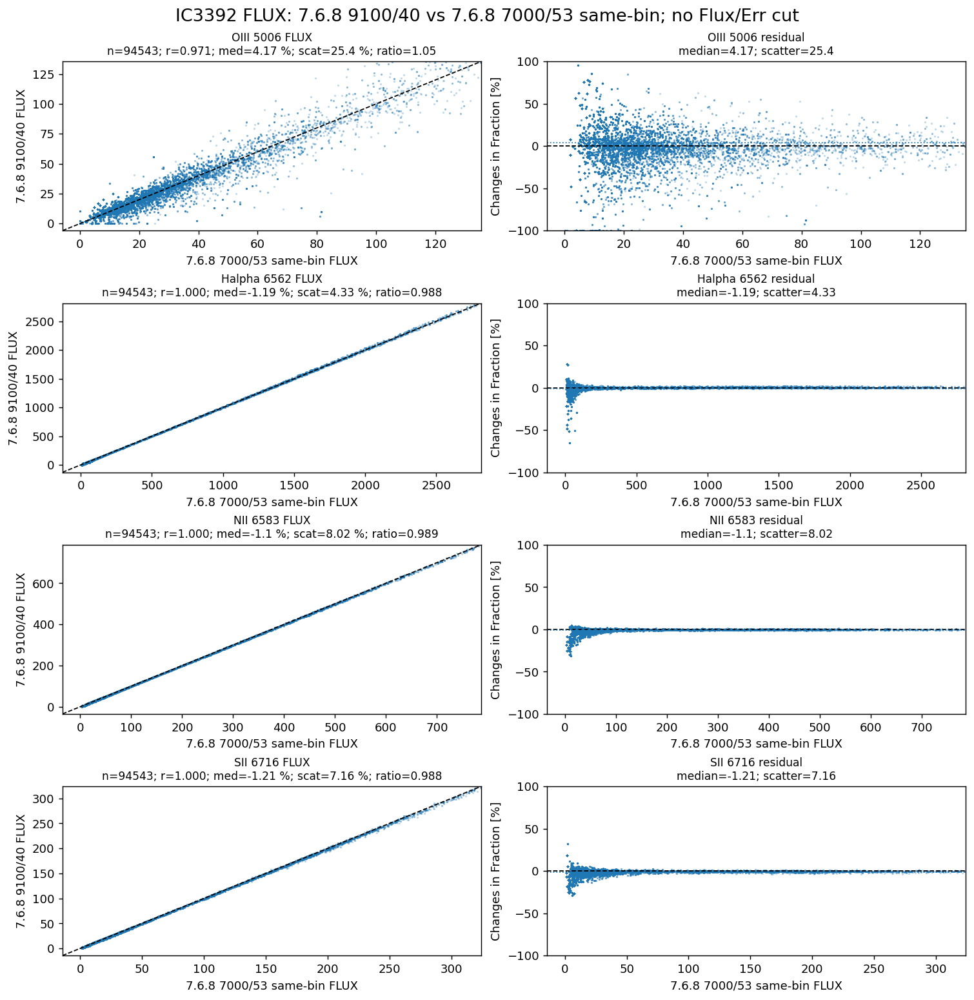

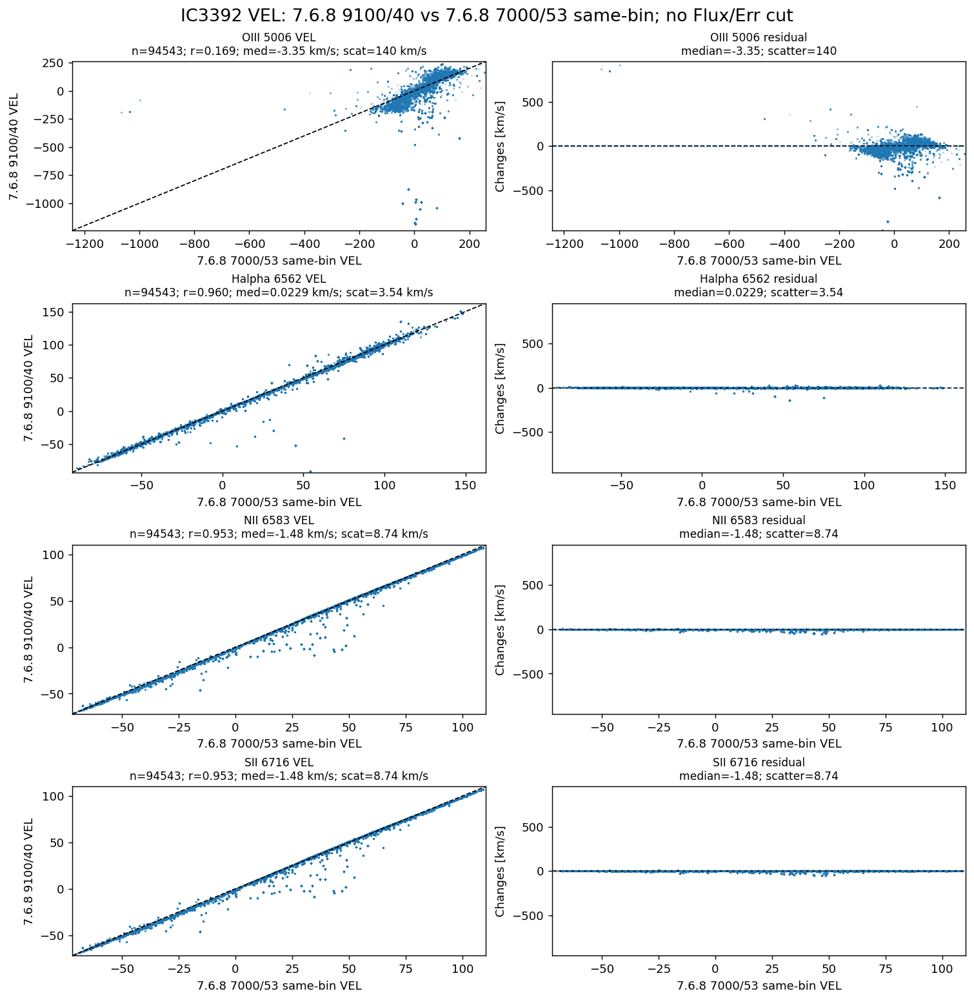

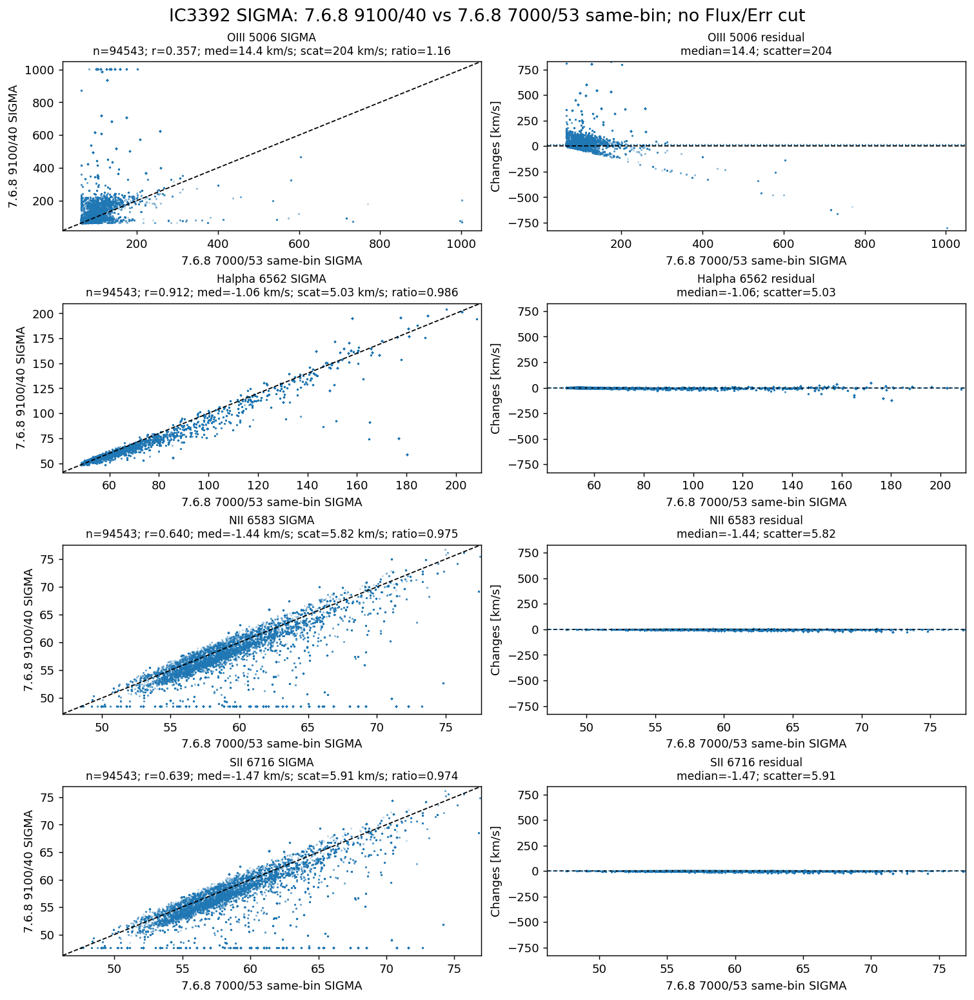

In [6]:
def residual_limit_for(quantity, snr_cuts):
    residuals = []
    for line in LINE_ORDER:
        for snr_cut in snr_cuts:
            x, y, _ = pair_arrays(line, quantity, snr_cut)
            if x.size:
                residuals.append(residual_values(x, y, quantity))
    if quantity == 'FLUX':
        fallback = 1.0
        lower = 1e-6
    elif quantity == 'VEL':
        fallback = 20.0
        lower = 5.0
    else:
        fallback = 20.0
        lower = 5.0
    limit = robust_symmetric_limit(finite_values(residuals), percentile=98, fallback=fallback)
    return max(limit, lower)


def stat_text(stats, quantity, include_ratio=False):
    unit = residual_unit_label(quantity)
    pieces = [
        f'n={stats["n_valid"]}',
        f'r={stats["pearson_r"]:.3f}',
        f'med={stats["median_residual_compare_minus_reference"]:.3g} {unit}',
        f'scat={stats["robust_sigma_residual"]:.3g} {unit}',
    ]
    if include_ratio and np.isfinite(stats['median_ratio_compare_over_reference']):
        pieces.append(f'ratio={stats["median_ratio_compare_over_reference"]:.3g}')
    return '; '.join(pieces)


def plot_quantity_pairwise(quantity, snr_cut=None, color=NO_CUT_COLOR, max_points=30000, random_state=12):
    residual_limit = residual_limit_for(quantity, [snr_cut])
    fig, axes = plt.subplots(
        len(LINE_ORDER),
        2,
        figsize=(11.5, 2.95 * len(LINE_ORDER)),
        squeeze=False,
        constrained_layout=True,
    )
    fig.suptitle(
        f'IC3392 {quantity}: {RUNS[COMPARE_RUN]["plot_label"]} vs {RUNS[BASELINE_RUN]["plot_label"]}; {cut_label(snr_cut)}',
        fontsize=15,
    )

    for row, line in enumerate(LINE_ORDER):
        scatter_ax = axes[row, 0]
        residual_ax = axes[row, 1]
        x, y, _ = pair_arrays(line, quantity, snr_cut)
        stats = pair_stats(line, quantity, snr_cut)

        if x.size == 0:
            scatter_ax.set_title(f'{LINE_LABELS[line]}: no valid spaxels')
            residual_ax.set_title(f'{LINE_LABELS[line]}: no valid spaxels')
            continue

        px, py = sample_for_plot(x, y, max_points=max_points, random_state=random_state + row)
        pres = residual_values(px, py, quantity)
        all_residual = residual_values(x, y, quantity)
        lo, hi = robust_limits(np.r_[x, y], p=(1, 99))

        scatter_ax.scatter(px, py, s=3, alpha=0.28, linewidths=0, color=color)
        scatter_ax.plot([lo, hi], [lo, hi], color='black', linestyle='--', linewidth=1)
        scatter_ax.set_xlim(lo, hi)
        scatter_ax.set_ylim(lo, hi)
        scatter_ax.set_xlabel(f'{RUNS[BASELINE_RUN]["plot_label"]} {quantity}')
        scatter_ax.set_ylabel(f'{RUNS[COMPARE_RUN]["plot_label"]} {quantity}')
        scatter_ax.set_title(
            f'{LINE_LABELS[line]} {quantity}\n{stat_text(stats, quantity, include_ratio=quantity in ["FLUX", "SIGMA"])}',
            fontsize=9.5,
        )

        residual_ax.scatter(px, pres, s=3, alpha=0.28, linewidths=0, color=color)
        residual_ax.axhline(0.0, color='black', linestyle='--', linewidth=1)
        residual_ax.axhline(np.nanmedian(all_residual), color=color, linestyle=':', linewidth=1)
        residual_ax.set_xlim(lo, hi)
        residual_ax.set_ylim(-residual_limit, residual_limit)
        residual_ax.set_xlabel(f'{RUNS[BASELINE_RUN]["plot_label"]} {quantity}')
        residual_ax.set_ylabel(change_axis_label(quantity))
        residual_ax.set_title(
            f'{LINE_LABELS[line]} residual\n'
            f'median={stats["median_residual_compare_minus_reference"]:.3g}; '
            f'scatter={stats["robust_sigma_residual"]:.3g}',
            fontsize=9.5,
        )

    plt.show()


for quantity in QUANTITIES:
    plot_quantity_pairwise(quantity, snr_cut=None, color=NO_CUT_COLOR, random_state=40)


## Flux/Error Cut Overplots

The next three figures overplot `Flux/Err > 0`, `> 3`, `> 5`, `> 10`, `> 20`, and `> 50` in different colors. The cut is applied to both runs for the same gas line before plotting each quantity.

Each residual panel includes compact median/scatter numbers for the same cuts, so the visual trumpet shape can be tied directly to the table above.


In [7]:
cut_summary = pd.DataFrame([
    pair_stats(line, quantity, snr_cut=cut)
    for quantity in QUANTITIES
    for line in LINE_ORDER
    for cut in FLUXERR_CUTS
])
display(cut_summary)


,line,line_label,quantity,fluxerr_cut,n_valid,fraction_map,pearson_r,median_reference,median_compare,median_residual_compare_minus_reference,median_abs_residual,p16_residual,p84_residual,robust_sigma_residual,rms_residual,median_ratio_compare_over_reference,p16_ratio,p84_ratio,robust_sigma_ratio,median_log10_ratio
0,OIII5006,OIII 5006,FLUX,>0,92842,0.485053,0.971203,13.237359,15.012155,4.569260,12.568018,-11.980338,38.697539,25.338939,45.481112,1.045693,0.880197,1.386975,0.253389,0.019404
1,OIII5006,OIII 5006,FLUX,>3,89041,0.465194,0.974009,13.659960,15.430485,5.439169,11.312689,-9.889455,40.802424,25.345940,44.769926,1.054392,0.901105,1.408024,0.253459,0.023002
2,OIII5006,OIII 5006,FLUX,>5,81852,0.427635,0.980426,13.688529,15.846753,6.909722,11.222115,-7.553975,44.349097,25.951536,45.814001,1.069097,0.924460,1.443491,0.259515,0.029017
3,OIII5006,OIII 5006,FLUX,>10,44178,0.230808,0.987940,12.882029,15.874028,8.366931,10.848013,-3.950650,61.851640,32.901145,51.629842,1.083669,0.960493,1.618516,0.329011,0.034897
4,OIII5006,OIII 5006,FLUX,>20,4423,0.023108,0.997216,14.756740,15.777212,7.268495,7.700484,0.412160,13.938873,6.763356,11.008931,1.072685,1.004122,1.139389,0.067634,0.030472
5,OIII5006,OIII 5006,FLUX,>50,60,0.000313,NaN,75.060157,75.756744,0.928038,0.928038,0.928038,0.928038,0.000000,0.928038,1.009280,1.009280,1.009280,0.000000,0.004012
6,HA6562,Halpha 6562,FLUX,>0,94543,0.493940,0.999961,28.130120,27.295379,-1.186821,2.668499,-7.066272,1.587262,4.326767,9.439393,0.988132,0.929337,1.015873,0.043268,-0.005185
7,HA6562,Halpha 6562,FLUX,>3,94543,0.493940,0.999961,28.130120,27.295379,-1.186821,2.668499,-7.066272,1.587262,4.326767,9.439393,0.988132,0.929337,1.015873,0.043268,-0.005185
8,HA6562,Halpha 6562,FLUX,>5,94543,0.493940,0.999961,28.130120,27.295379,-1.186821,2.668499,-7.066272,1.587262,4.326767,9.439393,0.988132,0.929337,1.015873,0.043268,-0.005185
9,HA6562,Halpha 6562,FLUX,>10,94148,0.491876,0.999961,28.155811,27.352640,-1.187049,2.615783,-6.957182,1.587262,4.272222,9.290730,0.988130,0.930428,1.015873,0.042722,-0.005186


## Compact Median/Scatter Tables

These tables pull out the median residual and robust scatter for the main Flux/Err cuts. For `FLUX`, residuals are percent changes relative to the same-binning 7000 reference. For `VEL` and `SIGMA`, residuals are km/s differences.


In [8]:
summary_columns = [
    'quantity', 'line', 'fluxerr_cut', 'n_valid', 'pearson_r',
    'median_residual_compare_minus_reference', 'robust_sigma_residual',
    'p16_residual', 'p84_residual',
    'median_ratio_compare_over_reference', 'robust_sigma_ratio', 'median_log10_ratio',
]
compact_cut_summary = cut_summary[summary_columns].copy()
display(compact_cut_summary)

high_snr_summary = compact_cut_summary[compact_cut_summary['fluxerr_cut'].isin(['>10', '>20', '>50'])]
display(high_snr_summary)


,quantity,line,fluxerr_cut,n_valid,pearson_r,median_residual_compare_minus_reference,robust_sigma_residual,p16_residual,p84_residual,median_ratio_compare_over_reference,robust_sigma_ratio,median_log10_ratio
0,FLUX,OIII5006,>0,92842,0.971203,4.569260,25.338939,-11.980338,38.697539,1.045693,0.253389,0.019404
1,FLUX,OIII5006,>3,89041,0.974009,5.439169,25.345940,-9.889455,40.802424,1.054392,0.253459,0.023002
2,FLUX,OIII5006,>5,81852,0.980426,6.909722,25.951536,-7.553975,44.349097,1.069097,0.259515,0.029017
3,FLUX,OIII5006,>10,44178,0.987940,8.366931,32.901145,-3.950650,61.851640,1.083669,0.329011,0.034897
4,FLUX,OIII5006,>20,4423,0.997216,7.268495,6.763356,0.412160,13.938873,1.072685,0.067634,0.030472
5,FLUX,OIII5006,>50,60,NaN,0.928038,0.000000,0.928038,0.928038,1.009280,0.000000,0.004012
6,FLUX,HA6562,>0,94543,0.999961,-1.186821,4.326767,-7.066272,1.587262,0.988132,0.043268,-0.005185
7,FLUX,HA6562,>3,94543,0.999961,-1.186821,4.326767,-7.066272,1.587262,0.988132,0.043268,-0.005185
8,FLUX,HA6562,>5,94543,0.999961,-1.186821,4.326767,-7.066272,1.587262,0.988132,0.043268,-0.005185
9,FLUX,HA6562,>10,94148,0.999961,-1.187049,4.272222,-6.957182,1.587262,0.988130,0.042722,-0.005186


,quantity,line,fluxerr_cut,n_valid,pearson_r,median_residual_compare_minus_reference,robust_sigma_residual,p16_residual,p84_residual,median_ratio_compare_over_reference,robust_sigma_ratio,median_log10_ratio
3,FLUX,OIII5006,>10,44178,0.987940,8.366931,32.901145,-3.950650,61.851640,1.083669,0.329011,0.034897
4,FLUX,OIII5006,>20,4423,0.997216,7.268495,6.763356,0.412160,13.938873,1.072685,0.067634,0.030472
5,FLUX,OIII5006,>50,60,NaN,0.928038,0.000000,0.928038,0.928038,1.009280,0.000000,0.004012
9,FLUX,HA6562,>10,94148,0.999961,-1.187049,4.272222,-6.957182,1.587262,0.988130,0.042722,-0.005186
10,FLUX,HA6562,>20,82893,0.999962,-1.041299,3.981448,-6.466873,1.496022,0.989587,0.039814,-0.004546
11,FLUX,HA6562,>50,19092,0.999932,-0.016256,0.817640,-0.699497,0.935784,0.999837,0.008176,-0.000071
15,FLUX,NII6583,>10,94357,0.999968,-1.100837,8.016328,-15.544567,0.488089,0.988992,0.080163,-0.004807
16,FLUX,NII6583,>20,85771,0.999969,-0.876826,6.742392,-12.919588,0.565196,0.991232,0.067424,-0.003825
17,FLUX,NII6583,>50,18935,0.999968,-0.439723,0.920428,-1.466275,0.374581,0.995603,0.009204,-0.001914
21,FLUX,SII6716,>10,74943,0.999940,-0.869639,6.219230,-10.869957,1.568503,0.991304,0.062192,-0.003793


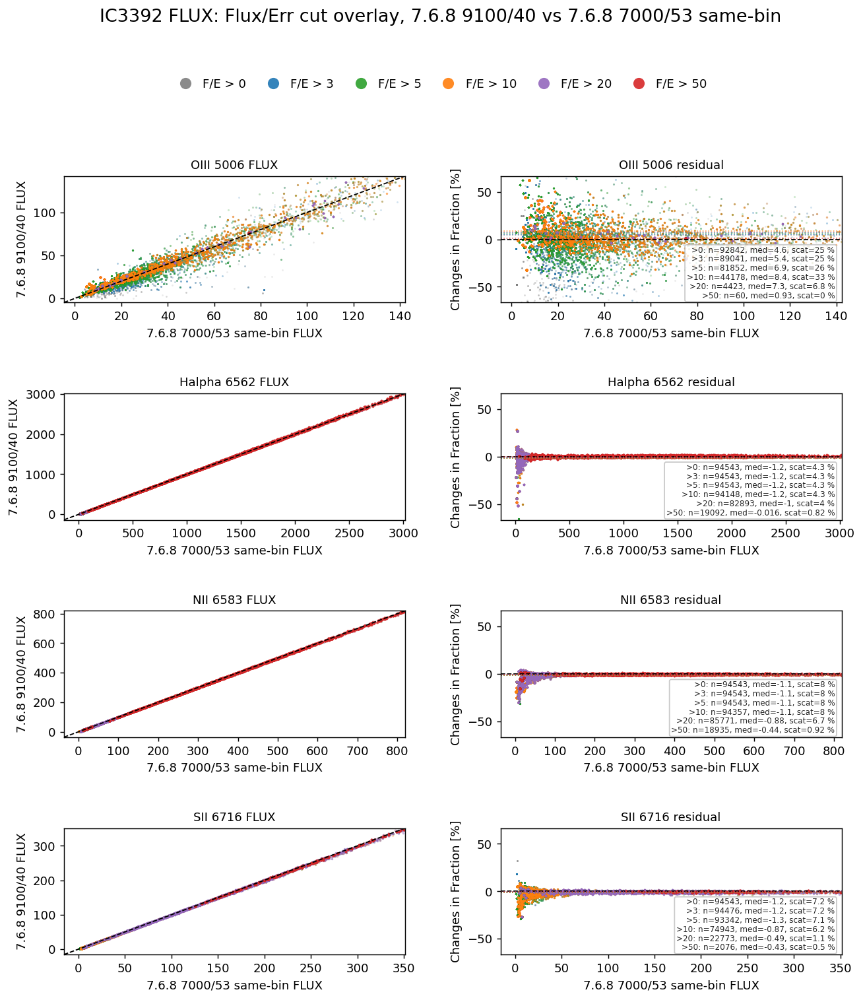

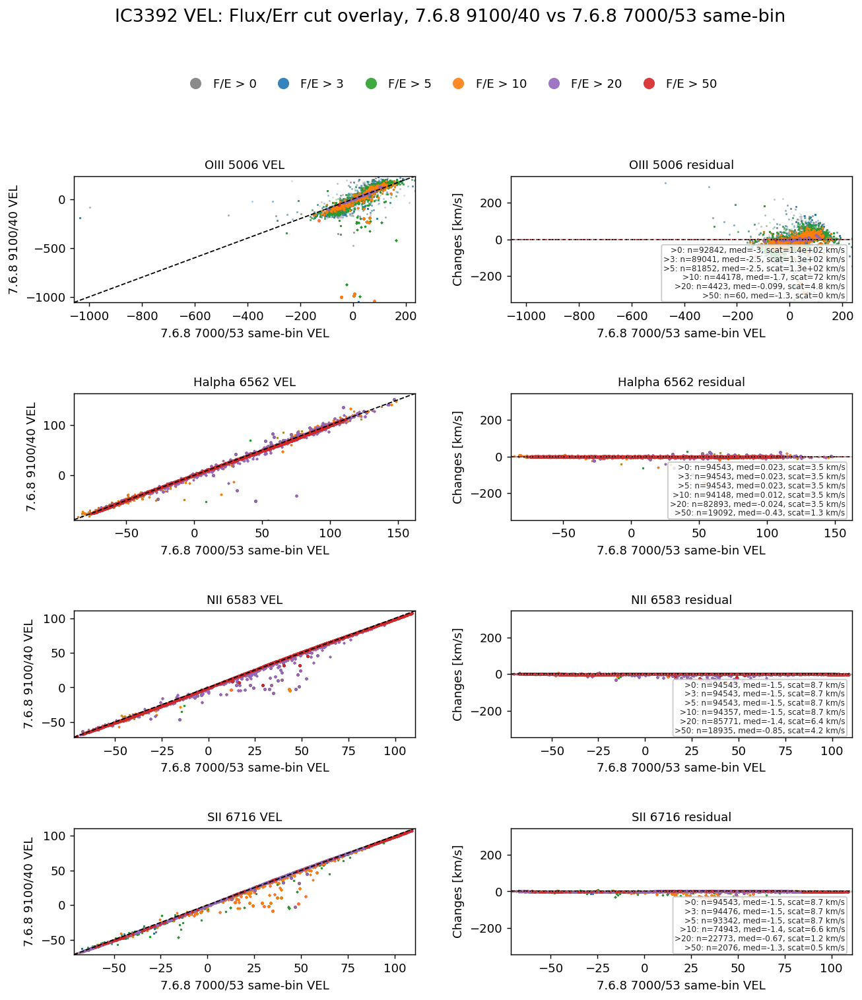

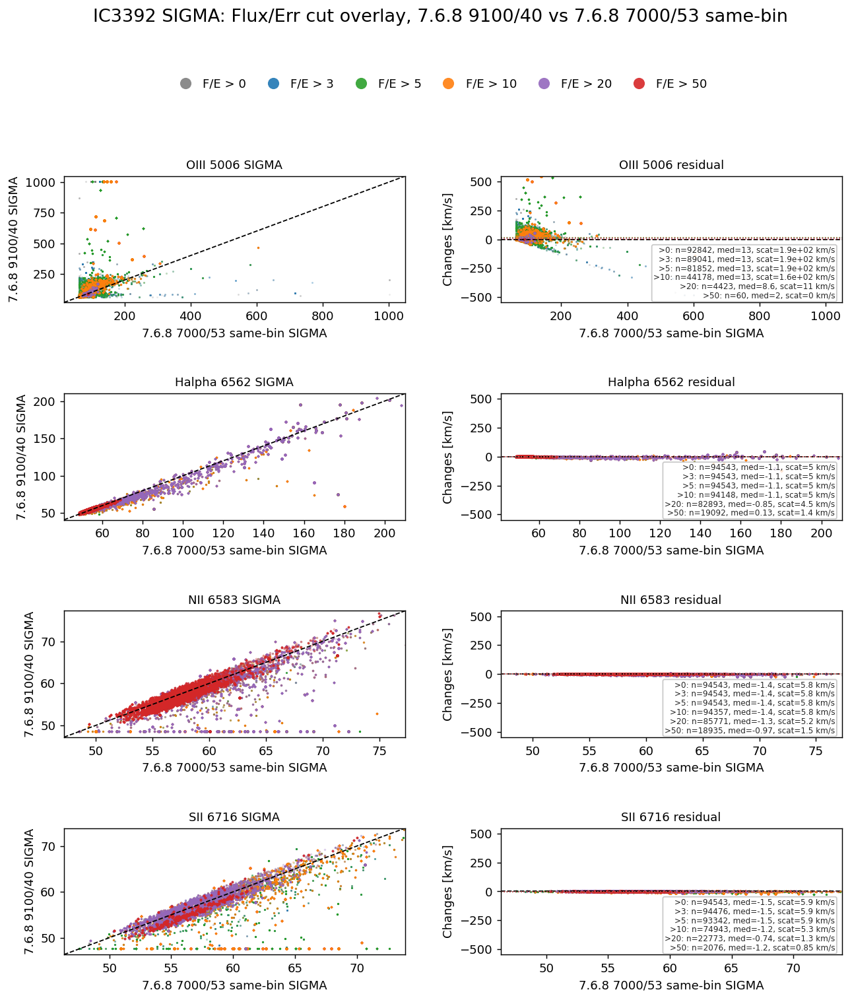

In [9]:
def overlay_stats_text(line, quantity, snr_cuts):
    unit = residual_unit_label(quantity)
    lines = []
    for cut in snr_cuts:
        stats = pair_stats(line, quantity, cut)
        if stats['n_valid'] == 0:
            lines.append(f'>{cut:g}: no data')
        else:
            lines.append(
                f'>{cut:g}: n={stats["n_valid"]}, med={stats["median_residual_compare_minus_reference"]:.2g}, '
                f'scat={stats["robust_sigma_residual"]:.2g} {unit}'
            )
    return '\n'.join(lines)


def plot_quantity_fluxerr_cut_overlay(quantity, snr_cuts=FLUXERR_CUTS, max_points=18000, random_state=80):
    residual_limit = residual_limit_for(quantity, snr_cuts)
    fig, axes = plt.subplots(
        len(LINE_ORDER),
        2,
        figsize=(11.7, 3.15 * len(LINE_ORDER)),
        squeeze=False,
        constrained_layout=False,
    )
    fig.suptitle(
        f'IC3392 {quantity}: Flux/Err cut overlay, {RUNS[COMPARE_RUN]["plot_label"]} vs {RUNS[BASELINE_RUN]["plot_label"]}',
        fontsize=15,
        y=0.985,
    )
    fig.subplots_adjust(top=0.83, hspace=0.72, wspace=0.28)

    legend_handles = [
        Line2D([0], [0], marker='o', linestyle='None', color='none',
               markerfacecolor=CUT_COLORS[cut], markeredgewidth=0,
               markersize=9.5, alpha=0.9)
        for cut in snr_cuts
    ]
    legend_labels = [f'F/E > {cut:g}' for cut in snr_cuts]
    for row, line in enumerate(LINE_ORDER):
        scatter_ax = axes[row, 0]
        residual_ax = axes[row, 1]

        all_x = []
        all_y = []
        for cut in snr_cuts:
            x, y, _ = pair_arrays(line, quantity, cut)
            if x.size:
                all_x.append(x)
                all_y.append(y)
        if not all_x:
            scatter_ax.set_title(f'{LINE_LABELS[line]}: no valid spaxels')
            residual_ax.set_title(f'{LINE_LABELS[line]}: no valid spaxels')
            continue

        lo, hi = robust_limits(np.r_[finite_values(all_x), finite_values(all_y)], p=(1, 99))
        scatter_ax.plot([lo, hi], [lo, hi], color='black', linestyle='--', linewidth=1)
        residual_ax.axhline(0.0, color='black', linestyle='--', linewidth=1)

        for cut_index, cut in enumerate(snr_cuts):
            color = CUT_COLORS[cut]
            x, y, _ = pair_arrays(line, quantity, cut)
            if x.size == 0:
                continue
            px, py = sample_for_plot(x, y, max_points=max_points, random_state=random_state + 17 * row + cut_index)
            pres = residual_values(px, py, quantity)
            all_residual = residual_values(x, y, quantity)
            alpha = 0.16 + 0.035 * cut_index
            size = 2.3 + 0.35 * cut_index

            scatter_ax.scatter(px, py, s=size, alpha=alpha, linewidths=0, color=color)
            residual_ax.scatter(px, pres, s=size, alpha=alpha, linewidths=0, color=color)
            residual_ax.axhline(np.nanmedian(all_residual), color=color, linestyle=':', linewidth=0.9, alpha=0.75)

        scatter_ax.set_xlim(lo, hi)
        scatter_ax.set_ylim(lo, hi)
        scatter_ax.set_xlabel(f'{RUNS[BASELINE_RUN]["plot_label"]} {quantity}')
        scatter_ax.set_ylabel(f'{RUNS[COMPARE_RUN]["plot_label"]} {quantity}')
        scatter_ax.set_title(f'{LINE_LABELS[line]} {quantity}', fontsize=10)

        residual_ax.set_xlim(lo, hi)
        residual_ax.set_ylim(-residual_limit, residual_limit)
        residual_ax.set_xlabel(f'{RUNS[BASELINE_RUN]["plot_label"]} {quantity}')
        residual_ax.set_ylabel(change_axis_label(quantity))
        residual_ax.set_title(f'{LINE_LABELS[line]} residual', fontsize=10)
        residual_ax.text(
            0.98,
            0.02,
            overlay_stats_text(line, quantity, snr_cuts),
            transform=residual_ax.transAxes,
            va='bottom',
            ha='right',
            fontsize=6.6,
            color='0.15',
            bbox={'boxstyle': 'round,pad=0.22', 'facecolor': 'white', 'edgecolor': '0.75', 'alpha': 0.82},
        )

    fig.legend(
        legend_handles,
        legend_labels,
        loc='upper center',
        ncol=len(legend_labels),
        bbox_to_anchor=(0.5, 0.925),
        frameon=False,
        handletextpad=0.45,
        columnspacing=1.25,
        borderaxespad=0.0,
    )
    plt.show()


for quantity in QUANTITIES:
    plot_quantity_fluxerr_cut_overlay(quantity, snr_cuts=FLUXERR_CUTS, random_state=90)


## OIII SIGMA Ratio And Log-Scale Focus

This section isolates `OIII5006` because it is the line most likely to be unreliable in IC3392. The aim is to separate two effects:

- how quickly the usable OIII sample collapses with increasing `Flux/Err`; and
- whether the remaining SIGMA difference looks more like a constant additive offset or a constant multiplicative offset.

For the multiplicative view, `SIGMA` is compared as `SIGMA_9100/40 / SIGMA_7000/53_samebinning` and as `log10(SIGMA_9100/40 / SIGMA_7000/53_samebinning)`. A horizontal trend around a non-zero log-ratio would support a roughly constant ratio.


,line,line_label,fluxerr_cut,n_reference_fluxerr_pass,n_compare_fluxerr_pass,n_both_fluxerr_pass,fraction_map_both_pass,reference_fluxerr_median_when_both_pass,compare_fluxerr_median_when_both_pass
0,OIII5006,OIII 5006,>0,94410,92904,92842,0.485053,10.630094,9.818601
1,OIII5006,OIII 5006,>3,93548,89175,89041,0.465194,10.699908,10.113129
2,OIII5006,OIII 5006,>5,89207,82046,81852,0.427635,10.958518,10.532129
3,OIII5006,OIII 5006,>10,52544,45419,44178,0.230808,13.619797,13.400294
4,OIII5006,OIII 5006,>20,4468,5986,4423,0.023108,22.660587,24.217719
5,OIII5006,OIII 5006,>50,60,60,60,0.000313,52.031861,52.645872


,line,fluxerr_cut,n_valid_sigma,fraction_map,median_reference_sigma,median_compare_sigma,median_delta_sigma,robust_sigma_delta,median_sigma_ratio,p16_sigma_ratio,p84_sigma_ratio,median_log10_sigma_ratio,robust_scatter_log10_sigma_ratio
0,OIII5006,>0,92842,0.485053,93.360881,100.815637,13.277971,185.536035,1.160473,0.937660,4.067699,0.064635,0.318652
1,OIII5006,>3,89041,0.465194,93.391643,100.886931,13.081524,185.589590,1.148748,0.936061,3.466274,0.060225,0.284279
2,OIII5006,>5,81852,0.427635,94.479068,104.348703,13.277971,187.180608,1.148748,0.942157,4.067699,0.060225,0.317613
3,OIII5006,>10,44178,0.230808,95.815964,107.526760,13.276999,161.197391,1.148748,0.957022,3.216165,0.060225,0.263208
4,OIII5006,>20,4423,0.023108,92.375117,101.025739,8.598074,10.895712,1.085100,1.003175,1.192979,0.035470,0.037628
5,OIII5006,>50,60,0.000313,88.161791,90.198626,2.036835,0.000000,1.023103,1.023103,1.023103,0.009920,0.000000


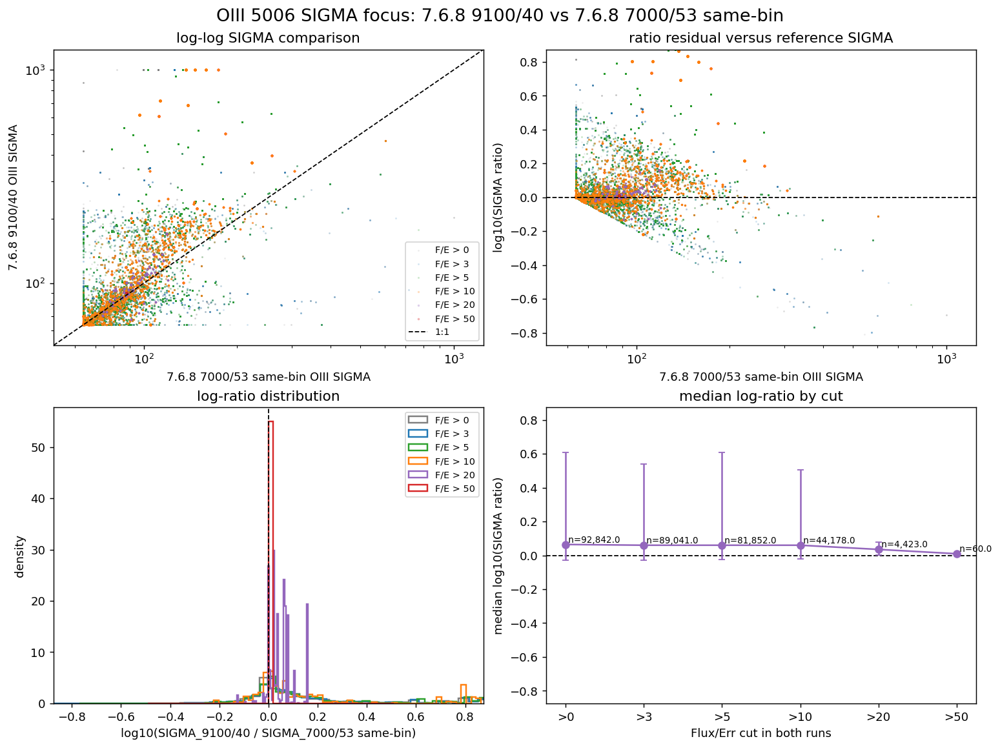

In [10]:
OIII_LINE = 'OIII5006'
OIII_SIGMA_CUTS = FLUXERR_CUTS


def positive_limits(values, p=(1, 99), fallback=(1.0, 100.0), pad_fraction=0.08):
    values = np.asarray(values)
    values = values[np.isfinite(values) & (values > 0)]
    if values.size == 0:
        return fallback
    lo, hi = np.nanpercentile(values, p)
    if not np.isfinite(lo) or not np.isfinite(hi) or lo <= 0 or lo == hi:
        lo, hi = fallback
    pad = pad_fraction * (np.log10(hi) - np.log10(lo)) if hi > lo else 0.1
    return float(10 ** (np.log10(lo) - pad)), float(10 ** (np.log10(hi) + pad))


def log10_ratio_values(x, y):
    ratio = ratio_values(x, y)
    log_ratio = np.full(ratio.shape, np.nan, dtype=float)
    mask = np.isfinite(ratio) & (ratio > 0)
    log_ratio[mask] = np.log10(ratio[mask])
    return log_ratio


def fluxerr_population_record(line, snr_cut):
    baseline_snr = line_fluxerr(BASELINE_RUN, line)
    compare_snr = line_fluxerr(COMPARE_RUN, line)
    finite_baseline = np.isfinite(baseline_snr)
    finite_compare = np.isfinite(compare_snr)
    baseline_pass = finite_baseline & (baseline_snr > snr_cut)
    compare_pass = finite_compare & (compare_snr > snr_cut)
    both_pass = baseline_pass & compare_pass
    return {
        'line': line,
        'line_label': LINE_LABELS[line],
        'fluxerr_cut': f'>{snr_cut:g}',
        'n_reference_fluxerr_pass': int(baseline_pass.sum()),
        'n_compare_fluxerr_pass': int(compare_pass.sum()),
        'n_both_fluxerr_pass': int(both_pass.sum()),
        'fraction_map_both_pass': float(both_pass.sum() / both_pass.size),
        'reference_fluxerr_median_when_both_pass': float(np.nanmedian(baseline_snr[both_pass])) if both_pass.any() else np.nan,
        'compare_fluxerr_median_when_both_pass': float(np.nanmedian(compare_snr[both_pass])) if both_pass.any() else np.nan,
    }


def sigma_ratio_focus_record(line, snr_cut):
    x, y, mask = pair_arrays(line, 'SIGMA', snr_cut)
    residual = residual_values(x, y, 'SIGMA')
    ratio = ratio_values(x, y)
    log_ratio = log10_ratio_values(x, y)
    finite_ratio = np.isfinite(ratio) & (ratio > 0)
    finite_log_ratio = np.isfinite(log_ratio)
    finite_residual = np.isfinite(residual)
    return {
        'line': line,
        'fluxerr_cut': f'>{snr_cut:g}',
        'n_valid_sigma': int(x.size),
        'fraction_map': float(x.size / mask.size) if mask.size else np.nan,
        'median_reference_sigma': float(np.nanmedian(x)) if x.size else np.nan,
        'median_compare_sigma': float(np.nanmedian(y)) if y.size else np.nan,
        'median_delta_sigma': float(np.nanmedian(residual[finite_residual])) if finite_residual.any() else np.nan,
        'robust_sigma_delta': float(0.5 * (np.nanpercentile(residual[finite_residual], 84) - np.nanpercentile(residual[finite_residual], 16))) if finite_residual.any() else np.nan,
        'median_sigma_ratio': float(np.nanmedian(ratio[finite_ratio])) if finite_ratio.any() else np.nan,
        'p16_sigma_ratio': float(np.nanpercentile(ratio[finite_ratio], 16)) if finite_ratio.any() else np.nan,
        'p84_sigma_ratio': float(np.nanpercentile(ratio[finite_ratio], 84)) if finite_ratio.any() else np.nan,
        'median_log10_sigma_ratio': float(np.nanmedian(log_ratio[finite_log_ratio])) if finite_log_ratio.any() else np.nan,
        'robust_scatter_log10_sigma_ratio': float(0.5 * (np.nanpercentile(log_ratio[finite_log_ratio], 84) - np.nanpercentile(log_ratio[finite_log_ratio], 16))) if finite_log_ratio.any() else np.nan,
    }


oiii_fluxerr_population = pd.DataFrame([
    fluxerr_population_record(line, cut)
    for line in LINE_ORDER
    for cut in OIII_SIGMA_CUTS
])
display(oiii_fluxerr_population[oiii_fluxerr_population['line'].eq(OIII_LINE)])

oiii_sigma_ratio_summary = pd.DataFrame([
    sigma_ratio_focus_record(OIII_LINE, cut)
    for cut in OIII_SIGMA_CUTS
])
display(oiii_sigma_ratio_summary)


def plot_oiii_sigma_log_ratio_focus(snr_cuts=OIII_SIGMA_CUTS, max_points=18000, random_state=420):
    fig, axes = plt.subplots(2, 2, figsize=(11.8, 8.8), constrained_layout=True)
    log_scatter_ax, log_ratio_ax = axes[0]
    hist_ax, trend_ax = axes[1]
    fig.suptitle(
        f'{LINE_LABELS[OIII_LINE]} SIGMA focus: {RUNS[COMPARE_RUN]["plot_label"]} vs {RUNS[BASELINE_RUN]["plot_label"]}',
        fontsize=15,
    )

    all_sigma = []
    all_log_ratio = []
    trend_rows = []

    for cut_index, cut in enumerate(snr_cuts):
        x, y, _ = pair_arrays(OIII_LINE, 'SIGMA', cut)
        positive = np.isfinite(x) & np.isfinite(y) & (x > 0) & (y > 0)
        x = x[positive]
        y = y[positive]
        if x.size == 0:
            continue

        ratio = y / x
        log_ratio = np.log10(ratio)
        finite = np.isfinite(log_ratio)
        x = x[finite]
        y = y[finite]
        ratio = ratio[finite]
        log_ratio = log_ratio[finite]
        if x.size == 0:
            continue

        all_sigma.extend([x, y])
        all_log_ratio.append(log_ratio)
        color = CUT_COLORS[cut]
        px, py = sample_for_plot(x, y, max_points=max_points, random_state=random_state + 13 * cut_index)
        sampled_log_ratio = np.log10(py / px)
        alpha = 0.15 + 0.04 * cut_index
        size = 2.2 + 0.35 * cut_index

        log_scatter_ax.scatter(px, py, s=size, alpha=alpha, linewidths=0, color=color, label=f'F/E > {cut:g}')
        log_ratio_ax.scatter(px, sampled_log_ratio, s=size, alpha=alpha, linewidths=0, color=color)
        hist_ax.hist(log_ratio, bins=55, density=True, histtype='step', linewidth=1.35, color=color, label=f'F/E > {cut:g}')

        trend_rows.append({
            'cut': cut,
            'xpos': cut_index,
            'n': int(x.size),
            'median_log10_ratio': float(np.nanmedian(log_ratio)),
            'p16_log10_ratio': float(np.nanpercentile(log_ratio, 16)),
            'p84_log10_ratio': float(np.nanpercentile(log_ratio, 84)),
            'median_ratio': float(np.nanmedian(ratio)),
        })

    lo, hi = positive_limits(finite_values(all_sigma), p=(1, 99), fallback=(30.0, 400.0))
    log_scatter_ax.plot([lo, hi], [lo, hi], color='black', linestyle='--', linewidth=1, label='1:1')
    log_scatter_ax.set_xscale('log')
    log_scatter_ax.set_yscale('log')
    log_scatter_ax.set_xlim(lo, hi)
    log_scatter_ax.set_ylim(lo, hi)
    log_scatter_ax.set_xlabel(f'{RUNS[BASELINE_RUN]["plot_label"]} OIII SIGMA')
    log_scatter_ax.set_ylabel(f'{RUNS[COMPARE_RUN]["plot_label"]} OIII SIGMA')
    log_scatter_ax.set_title('log-log SIGMA comparison')
    log_scatter_ax.legend(loc='lower right', fontsize=8, frameon=True)

    log_limit = robust_symmetric_limit(finite_values(all_log_ratio), percentile=98, fallback=0.35)
    log_limit = max(log_limit, 0.03)
    log_ratio_ax.axhline(0, color='black', linestyle='--', linewidth=1)
    log_ratio_ax.set_xscale('log')
    log_ratio_ax.set_xlim(lo, hi)
    log_ratio_ax.set_ylim(-log_limit, log_limit)
    log_ratio_ax.set_xlabel(f'{RUNS[BASELINE_RUN]["plot_label"]} OIII SIGMA')
    log_ratio_ax.set_ylabel('log10(SIGMA ratio)')
    log_ratio_ax.set_title('ratio residual versus reference SIGMA')

    hist_ax.axvline(0, color='black', linestyle='--', linewidth=1)
    hist_ax.set_xlim(-log_limit, log_limit)
    hist_ax.set_xlabel('log10(SIGMA_9100/40 / SIGMA_7000/53 same-bin)')
    hist_ax.set_ylabel('density')
    hist_ax.set_title('log-ratio distribution')
    hist_ax.legend(loc='upper right', fontsize=8, frameon=True)

    trend = pd.DataFrame(trend_rows)
    if not trend.empty:
        trend_ax.axhline(0, color='black', linestyle='--', linewidth=1)
        trend_ax.errorbar(
            trend['xpos'],
            trend['median_log10_ratio'],
            yerr=[trend['median_log10_ratio'] - trend['p16_log10_ratio'], trend['p84_log10_ratio'] - trend['median_log10_ratio']],
            fmt='o-',
            color='tab:purple',
            capsize=3,
            linewidth=1.4,
        )
        for _, row in trend.iterrows():
            trend_ax.text(row['xpos'], row['median_log10_ratio'], f' n={row["n"]:,}', fontsize=7.5, va='bottom', ha='left')
        trend_ax.set_xticks(trend['xpos'])
        trend_ax.set_xticklabels([f'>{cut:g}' for cut in trend['cut']])
        trend_ax.set_ylim(-log_limit, log_limit)
    trend_ax.set_xlabel('Flux/Err cut in both runs')
    trend_ax.set_ylabel('median log10(SIGMA ratio)')
    trend_ax.set_title('median log-ratio by cut')

    plt.show()


plot_oiii_sigma_log_ratio_focus()


## Individual Flux/Error Cut Figures

Each cell below makes the same 4 by 2 figures as the no-cut section, but with one `Flux/Err` threshold at a time. Each cut produces three figures: `FLUX`, `VEL`, and `SIGMA`.


Individual plots: Flux/Err > 0


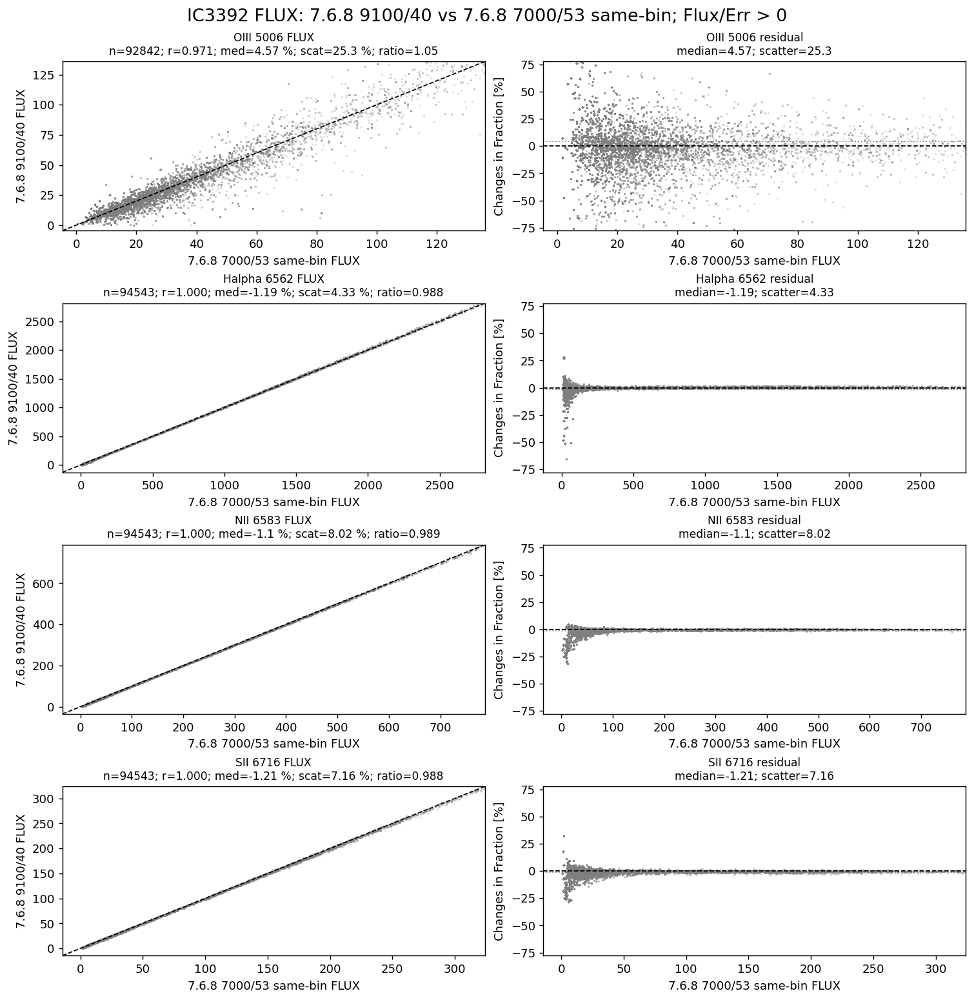

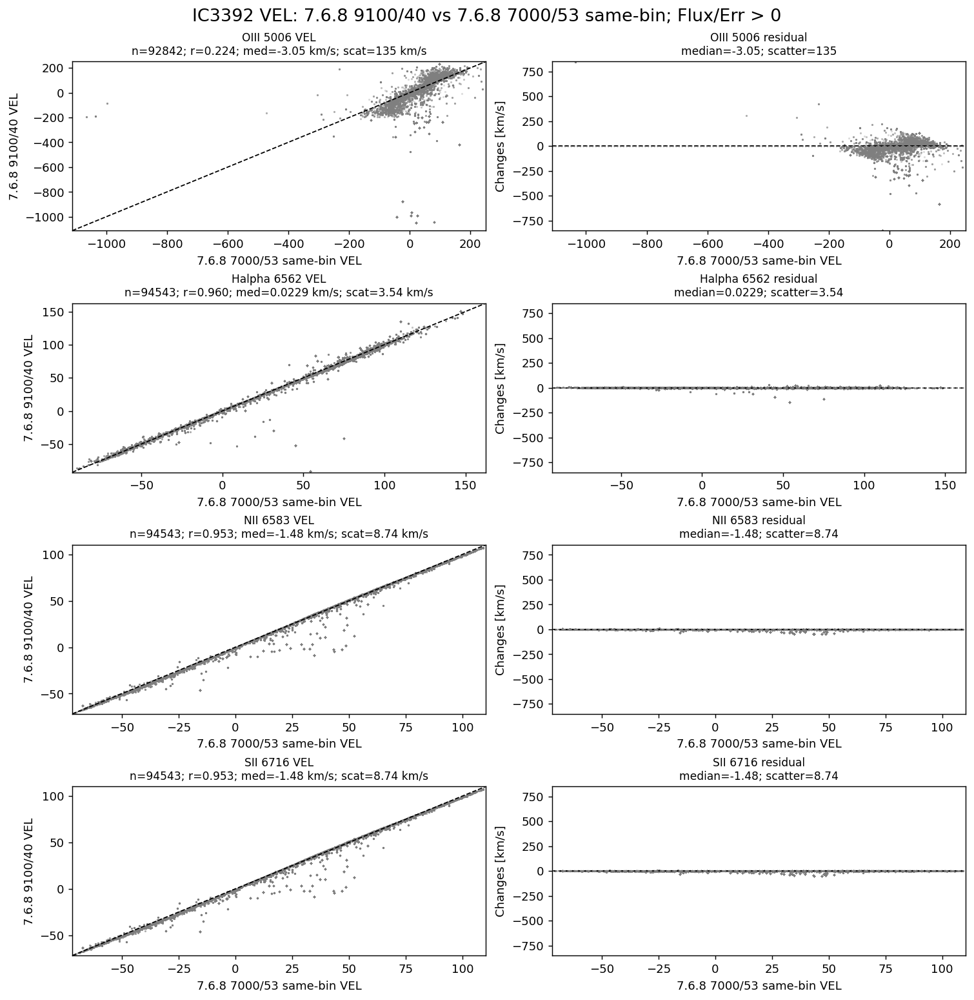

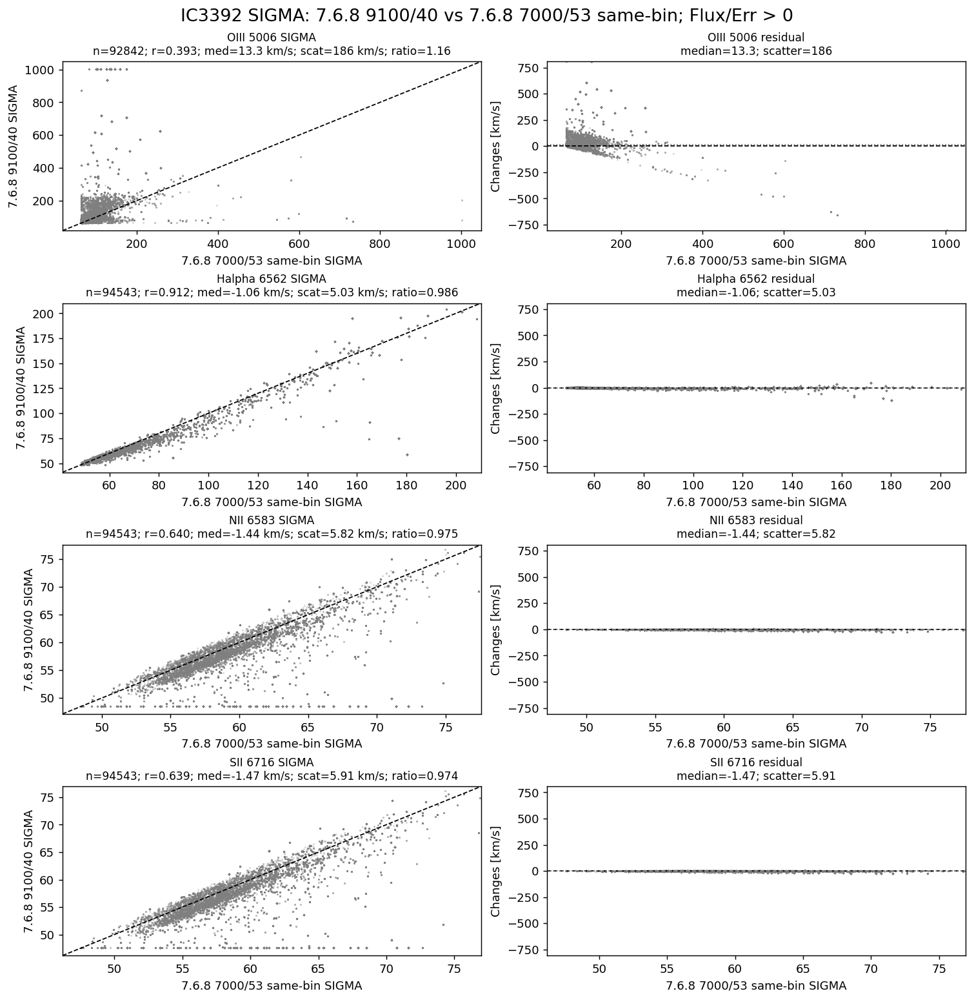

In [11]:
INDIVIDUAL_FLUXERR_CUT = 0
print(f'Individual plots: Flux/Err > {INDIVIDUAL_FLUXERR_CUT:g}')
for quantity in QUANTITIES:
    plot_quantity_pairwise(
        quantity,
        snr_cut=INDIVIDUAL_FLUXERR_CUT,
        color=CUT_COLORS[INDIVIDUAL_FLUXERR_CUT],
        random_state=120 + INDIVIDUAL_FLUXERR_CUT,
    )


Individual plots: Flux/Err > 3


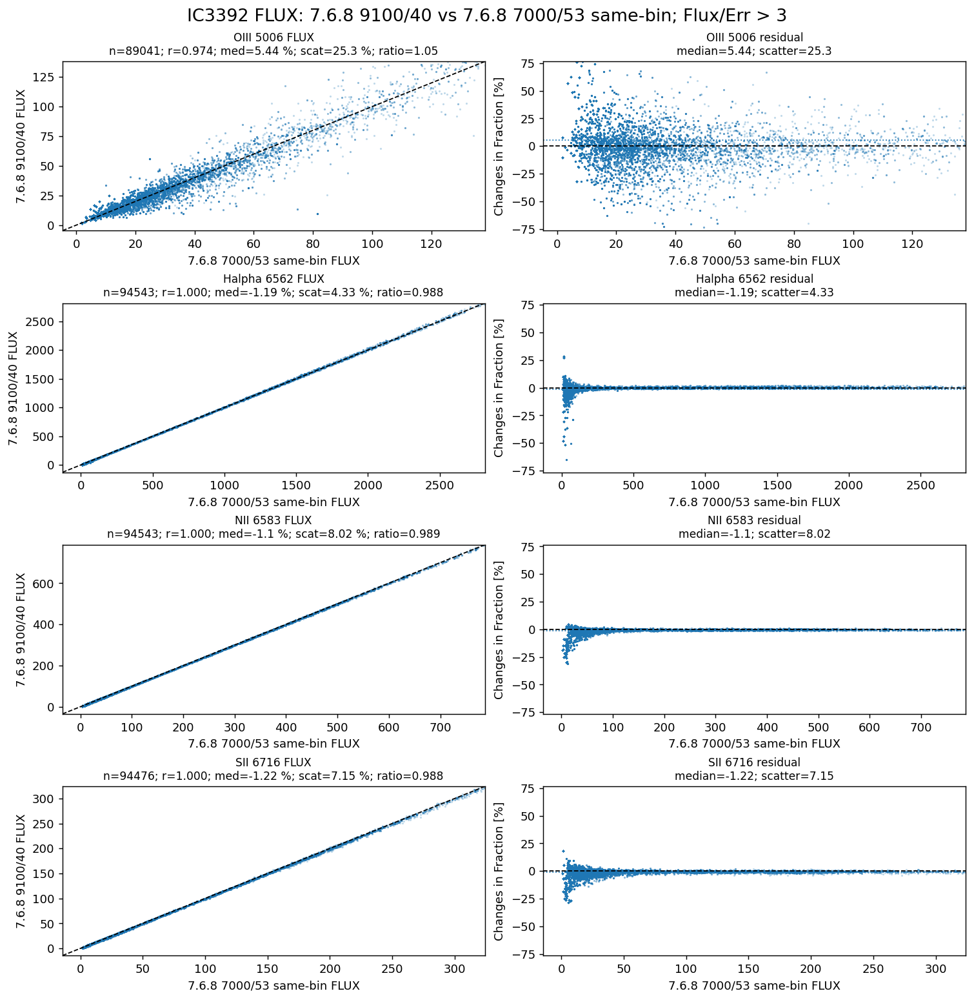

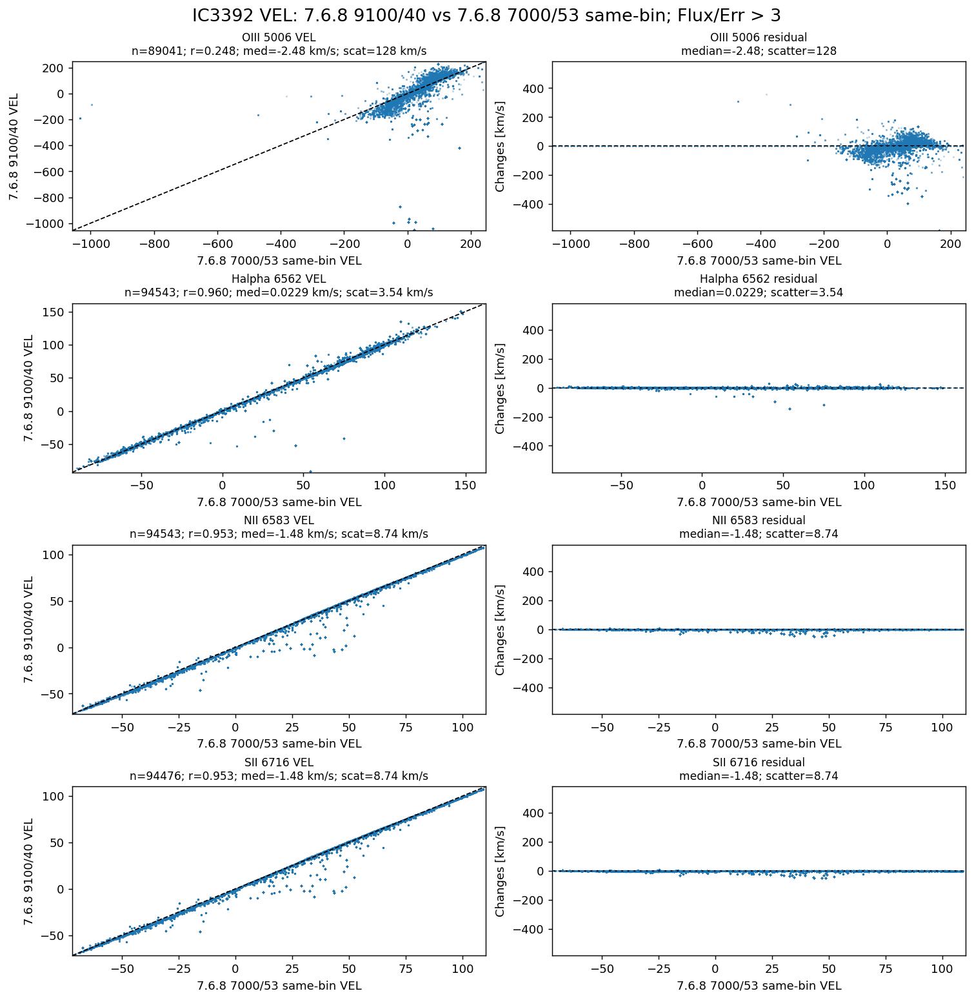

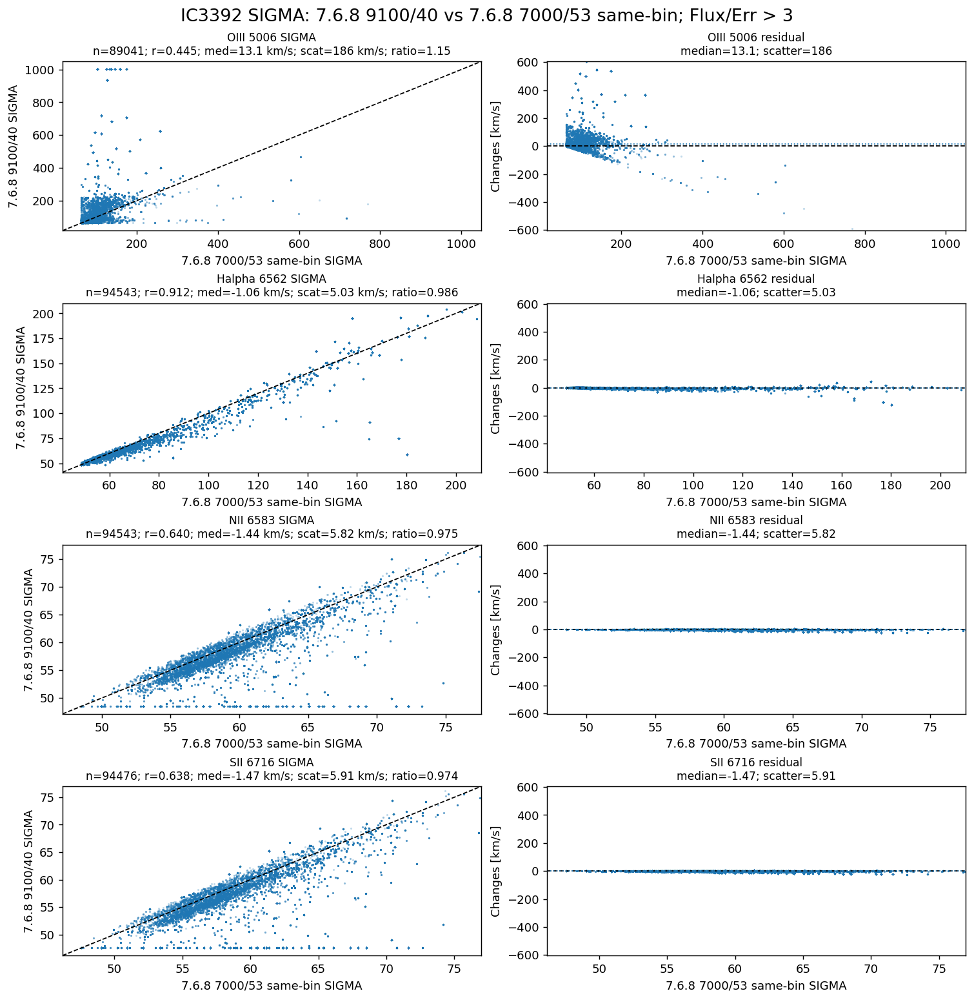

In [12]:
INDIVIDUAL_FLUXERR_CUT = 3
print(f'Individual plots: Flux/Err > {INDIVIDUAL_FLUXERR_CUT:g}')
for quantity in QUANTITIES:
    plot_quantity_pairwise(
        quantity,
        snr_cut=INDIVIDUAL_FLUXERR_CUT,
        color=CUT_COLORS[INDIVIDUAL_FLUXERR_CUT],
        random_state=120 + INDIVIDUAL_FLUXERR_CUT,
    )


Individual plots: Flux/Err > 5


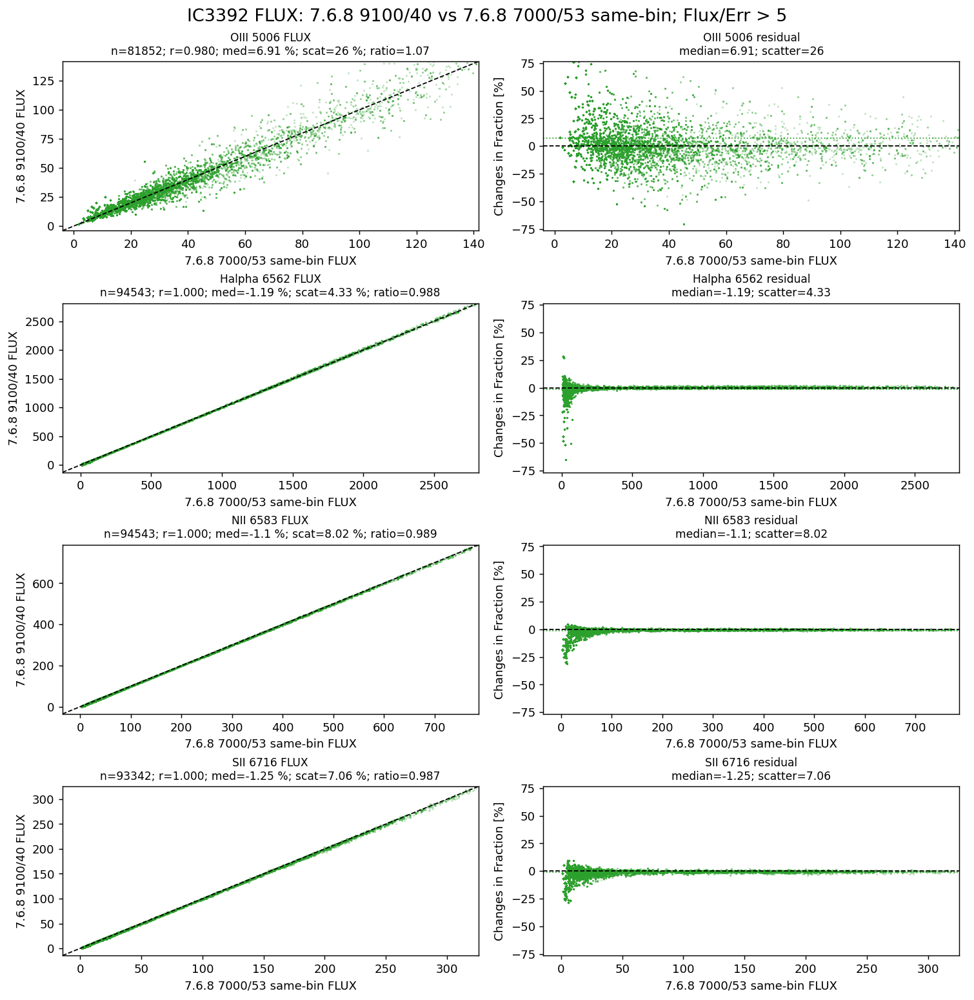

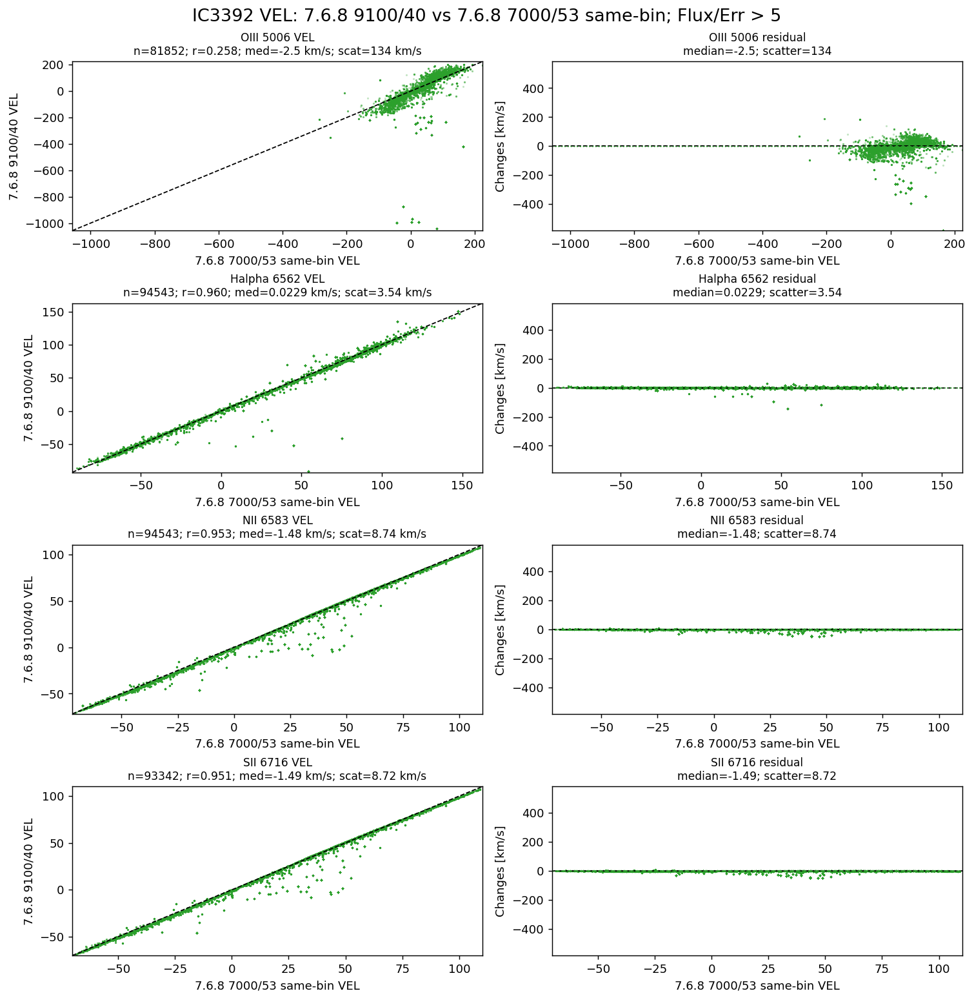

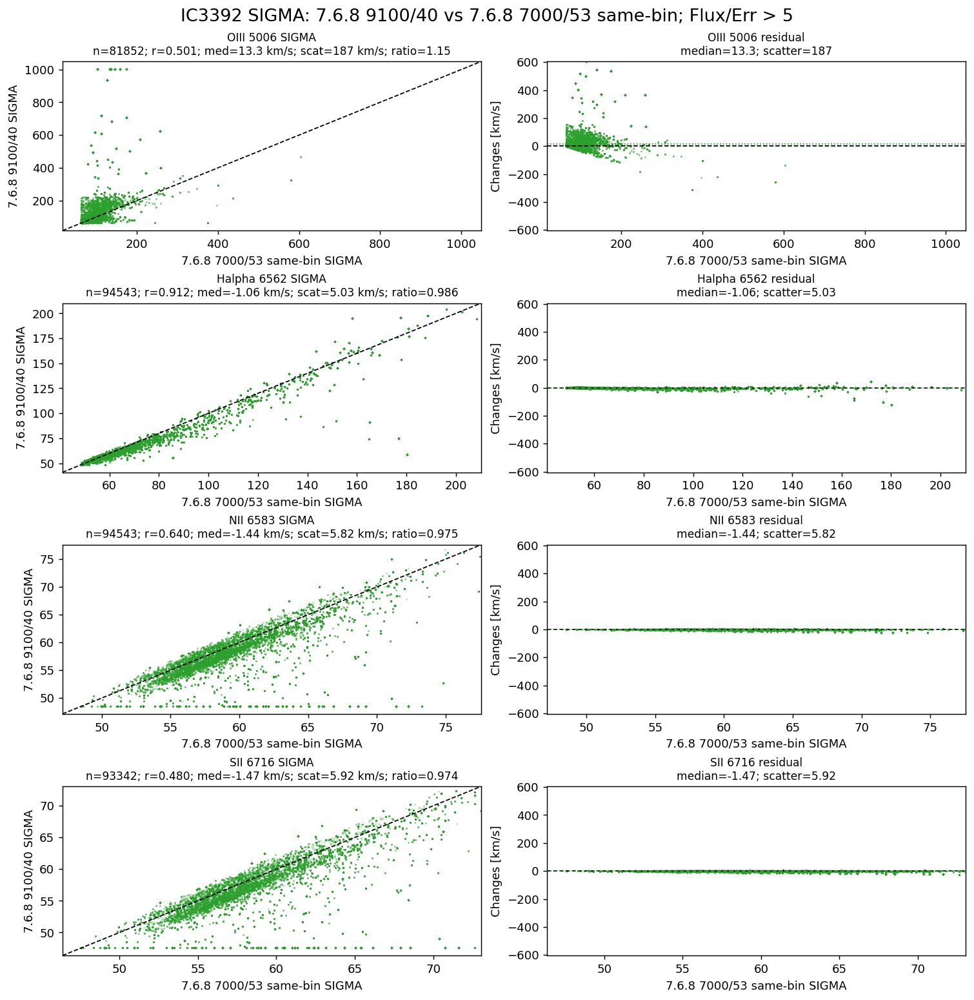

In [13]:
INDIVIDUAL_FLUXERR_CUT = 5
print(f'Individual plots: Flux/Err > {INDIVIDUAL_FLUXERR_CUT:g}')
for quantity in QUANTITIES:
    plot_quantity_pairwise(
        quantity,
        snr_cut=INDIVIDUAL_FLUXERR_CUT,
        color=CUT_COLORS[INDIVIDUAL_FLUXERR_CUT],
        random_state=120 + INDIVIDUAL_FLUXERR_CUT,
    )


Individual plots: Flux/Err > 10


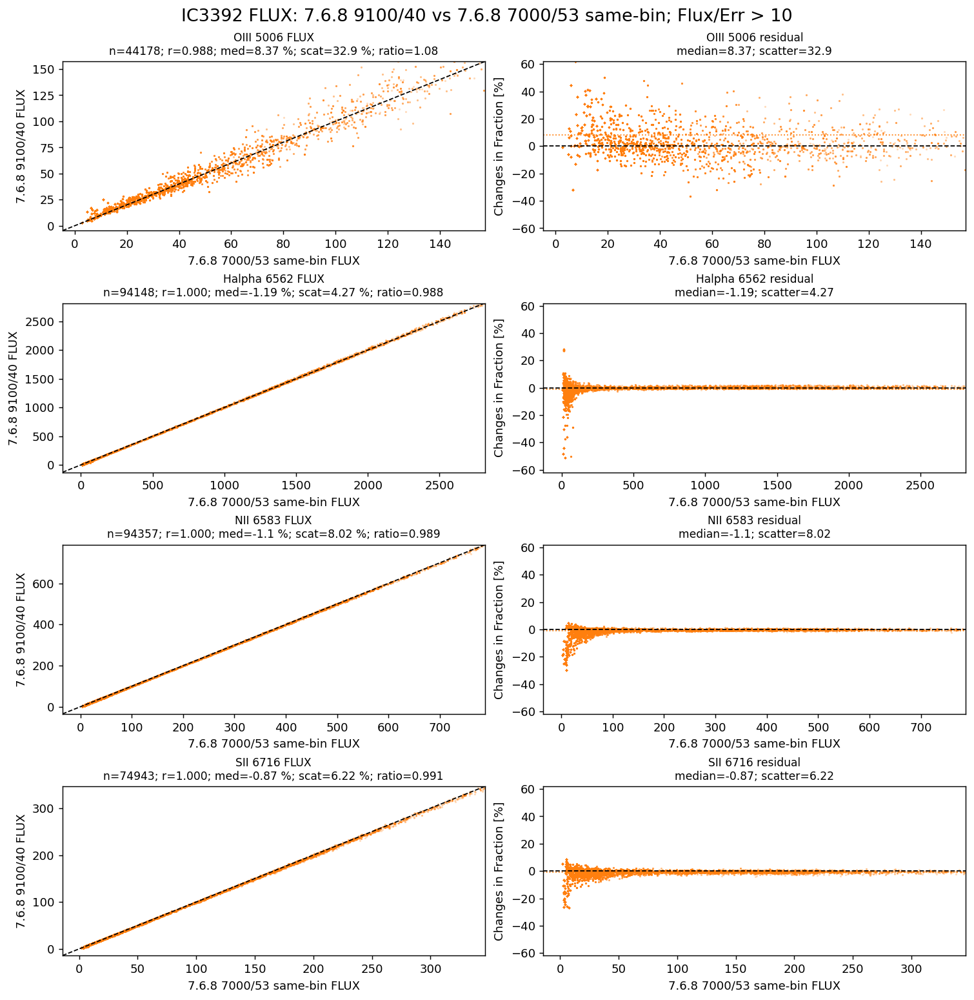

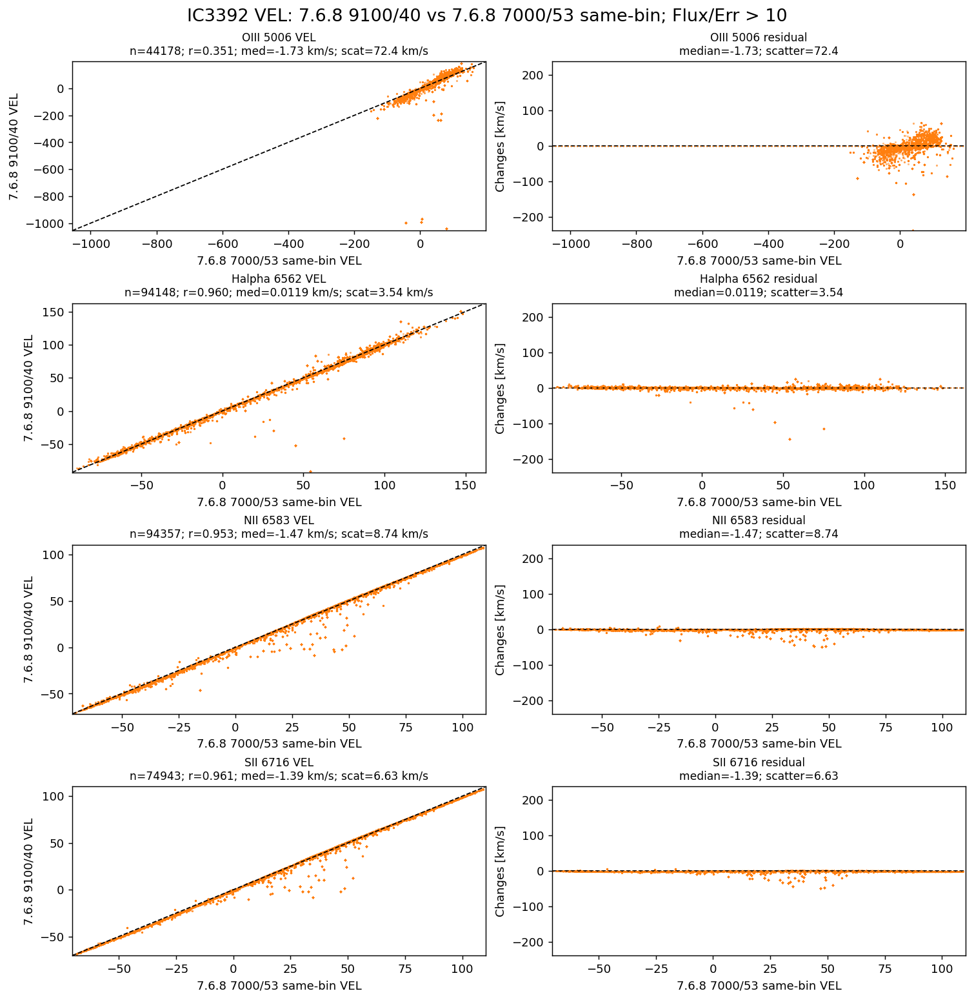

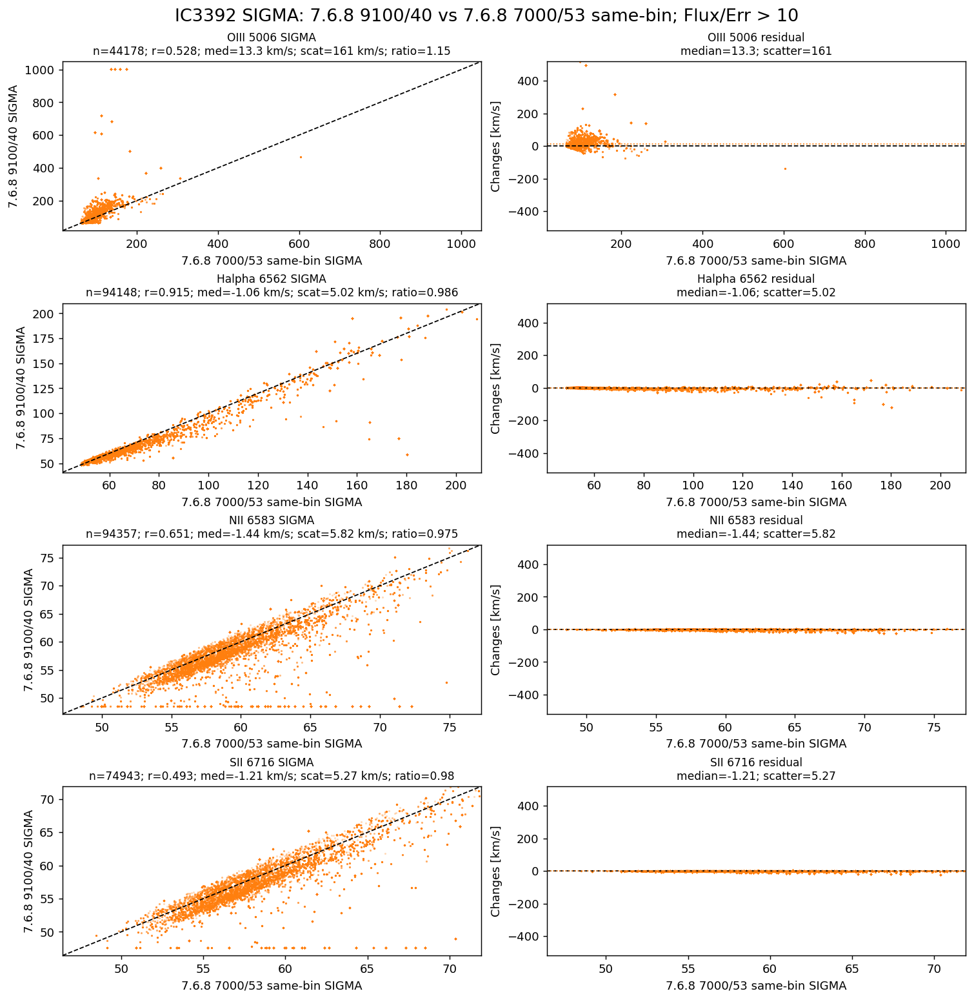

In [14]:
INDIVIDUAL_FLUXERR_CUT = 10
print(f'Individual plots: Flux/Err > {INDIVIDUAL_FLUXERR_CUT:g}')
for quantity in QUANTITIES:
    plot_quantity_pairwise(
        quantity,
        snr_cut=INDIVIDUAL_FLUXERR_CUT,
        color=CUT_COLORS[INDIVIDUAL_FLUXERR_CUT],
        random_state=120 + INDIVIDUAL_FLUXERR_CUT,
    )


Individual plots: Flux/Err > 20


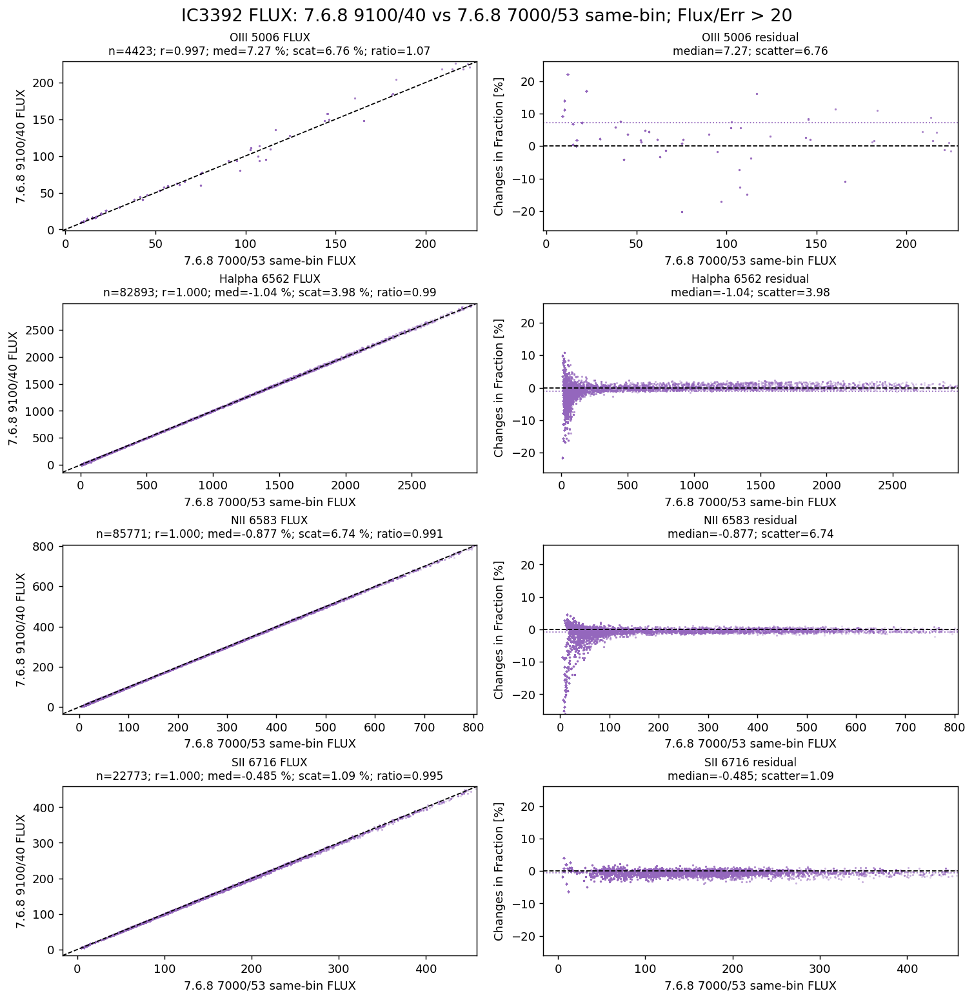

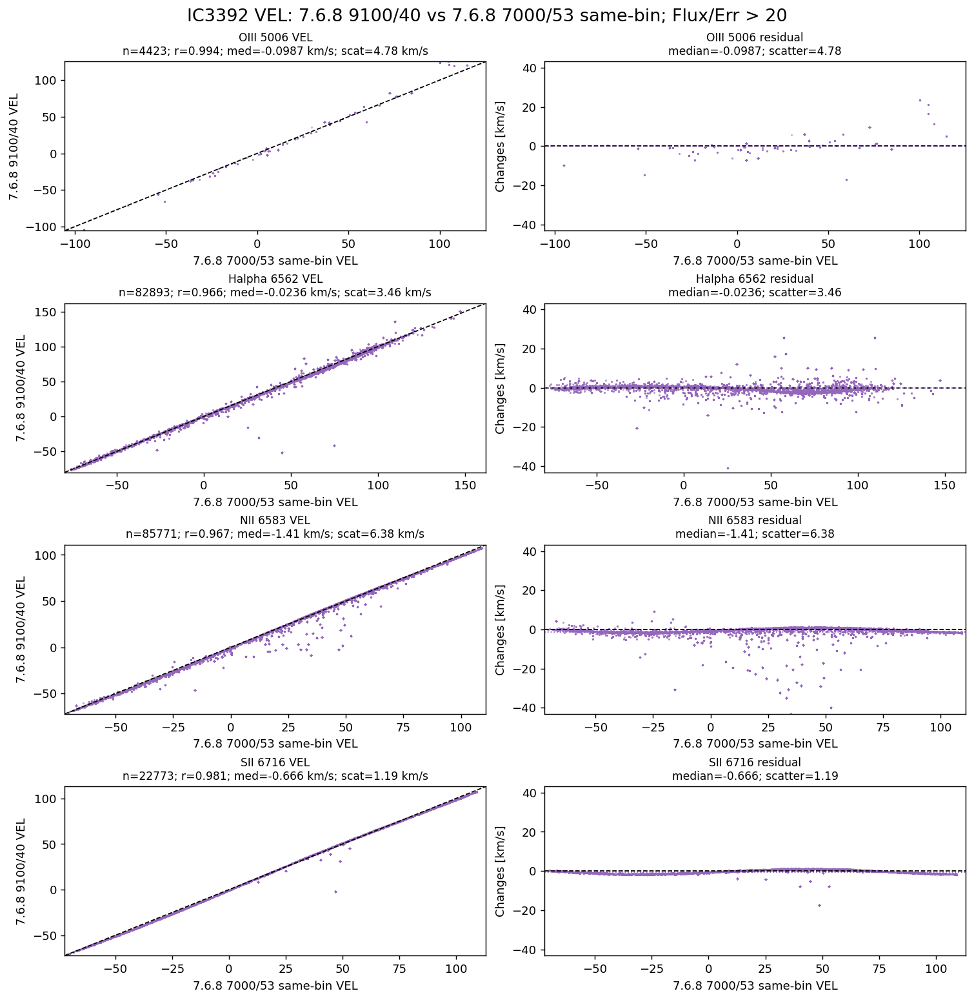

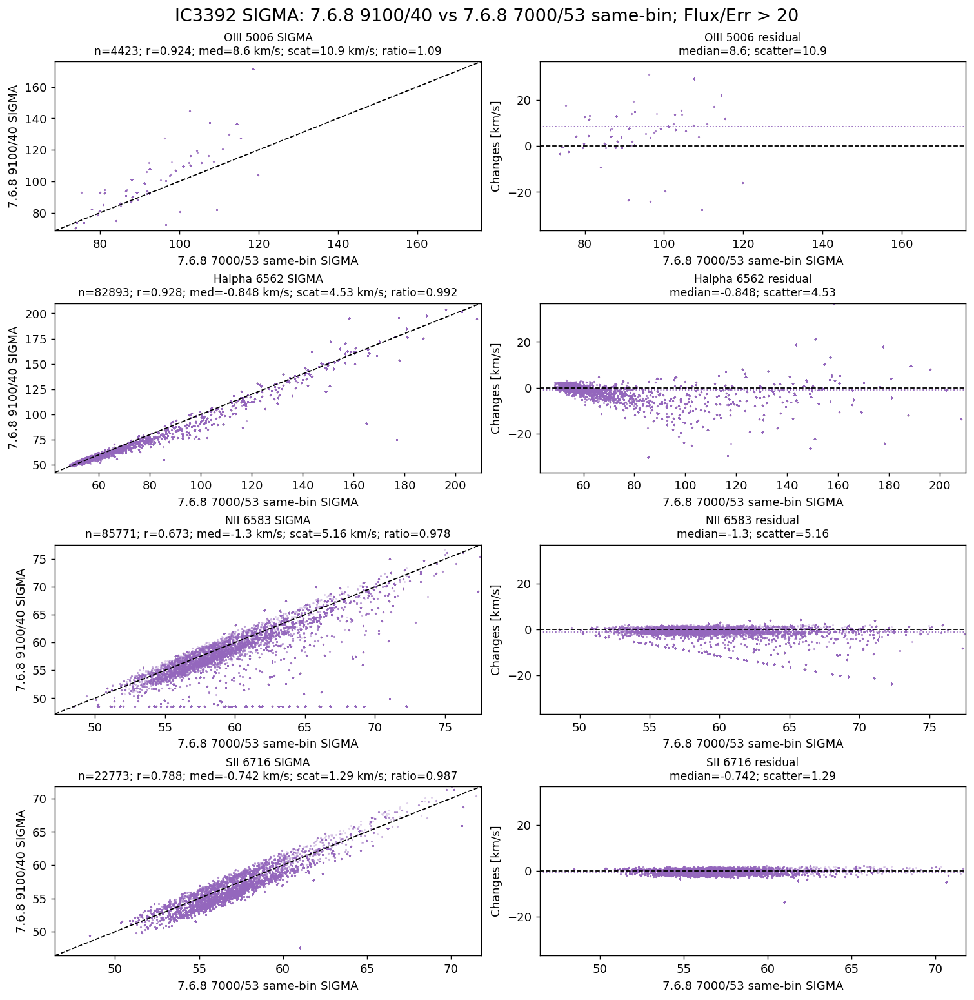

In [15]:
INDIVIDUAL_FLUXERR_CUT = 20
print(f'Individual plots: Flux/Err > {INDIVIDUAL_FLUXERR_CUT:g}')
for quantity in QUANTITIES:
    plot_quantity_pairwise(
        quantity,
        snr_cut=INDIVIDUAL_FLUXERR_CUT,
        color=CUT_COLORS[INDIVIDUAL_FLUXERR_CUT],
        random_state=120 + INDIVIDUAL_FLUXERR_CUT,
    )


Individual plots: Flux/Err > 50


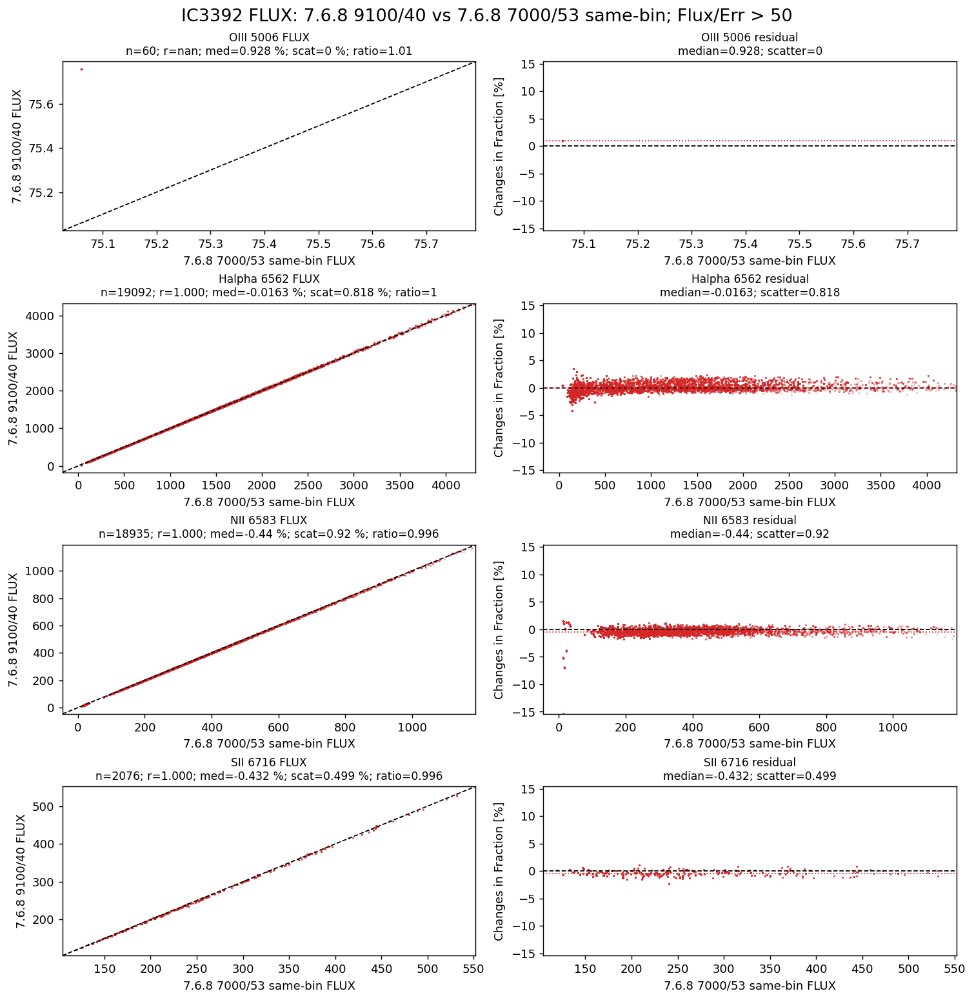

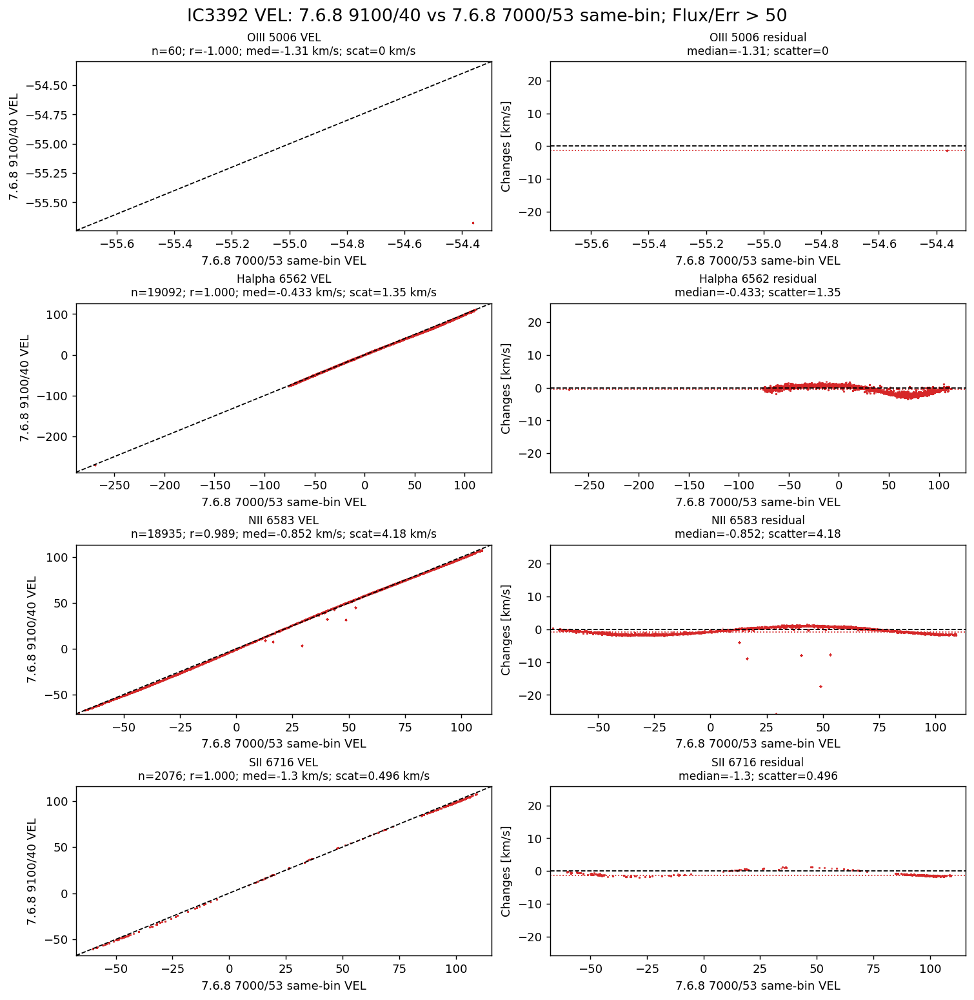

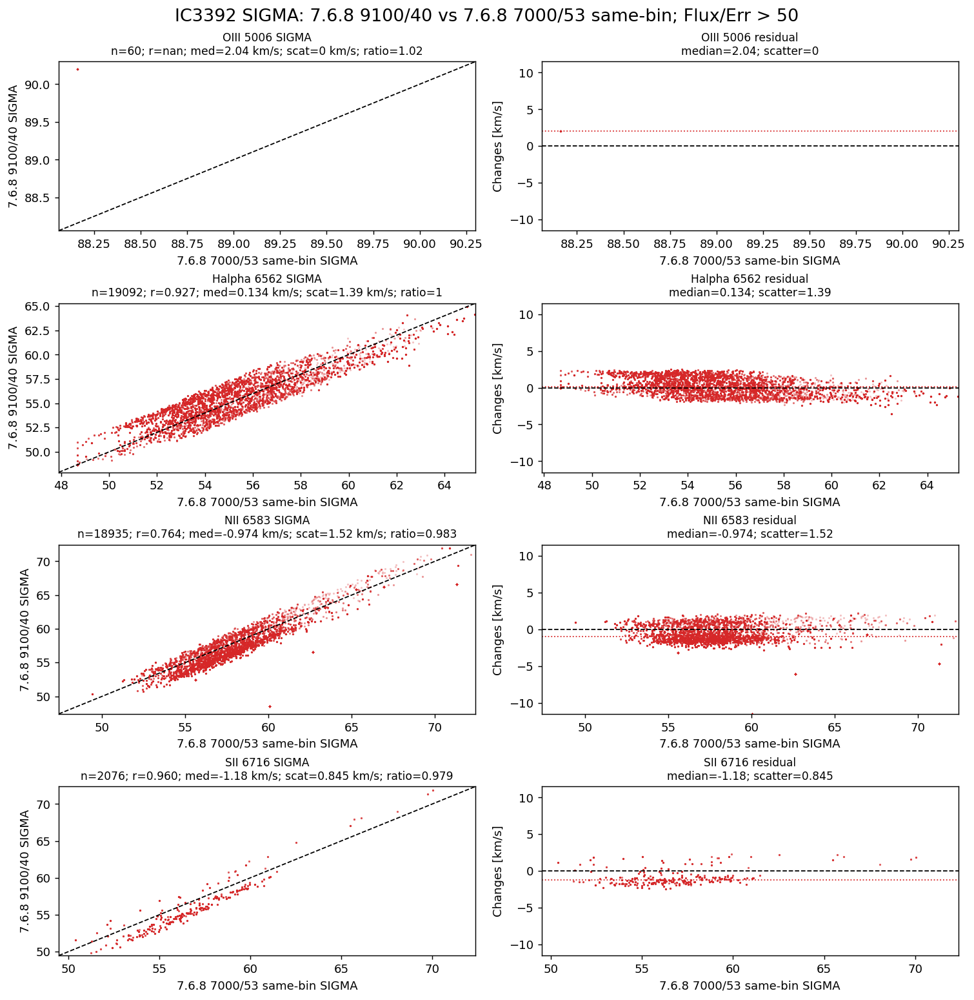

In [16]:
INDIVIDUAL_FLUXERR_CUT = 50
print(f'Individual plots: Flux/Err > {INDIVIDUAL_FLUXERR_CUT:g}')
for quantity in QUANTITIES:
    plot_quantity_pairwise(
        quantity,
        snr_cut=INDIVIDUAL_FLUXERR_CUT,
        color=CUT_COLORS[INDIVIDUAL_FLUXERR_CUT],
        random_state=120 + INDIVIDUAL_FLUXERR_CUT,
    )


## Quantitative SIGMA Boundary Check

This section tests the lower-envelope interpretation directly, now using the same-binning `7000/53` run as the reference. If the lower boundary in the `SIGMA` residual plot is caused by an effective minimum dispersion in the `9100/40` run, then with

`Changes = SIGMA_9100_40 - SIGMA_7000_53_samebinning`

we expect the lower envelope to follow approximately

`Changes = -SIGMA_7000_53_samebinning + SIGMA_floor`.

So the fitted envelope slope should be close to `-1`, and the intercept should be comparable to the effective floor. Here the comparison floor is taken directly from each line's `v768_9100_40` `*_SIGMA_CORR` HDU, for example `OIII5006_SIGMA_CORR`, `HA6562_SIGMA_CORR`, `NII6583_SIGMA_CORR`, and `SII6716_SIGMA_CORR`.


In [17]:
SIGMA_BOUNDARY_CUTS = [None, 0, 3, 5, 10, 20, 50]
LOWER_ENVELOPE_PERCENTILE = 2
SIGMA_BOUNDARY_N_BINS = 18
SIGMA_BOUNDARY_MIN_PER_BIN = 20


def sigma_corr_hdu_summary(line):
    values = maps[f'{line}_SIGMA_CORR'][COMPARE_RUN]
    values = values[np.isfinite(values)]
    if values.size == 0:
        return {
            'sigma_corr_hdu_n': 0,
            'sigma_corr_hdu_median': np.nan,
            'sigma_corr_hdu_p16': np.nan,
            'sigma_corr_hdu_p84': np.nan,
        }
    return {
        'sigma_corr_hdu_n': int(values.size),
        'sigma_corr_hdu_median': float(np.nanmedian(values)),
        'sigma_corr_hdu_p16': float(np.nanpercentile(values, 16)),
        'sigma_corr_hdu_p84': float(np.nanpercentile(values, 84)),
    }


def lower_envelope_points(x, residual, n_bins=SIGMA_BOUNDARY_N_BINS, lower_percentile=LOWER_ENVELOPE_PERCENTILE, min_per_bin=SIGMA_BOUNDARY_MIN_PER_BIN):
    x = np.asarray(x, dtype=float)
    residual = np.asarray(residual, dtype=float)
    valid = np.isfinite(x) & np.isfinite(residual)
    x = x[valid]
    residual = residual[valid]
    if x.size < 2 * min_per_bin:
        return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=int)

    edges = np.nanpercentile(x, np.linspace(2, 98, n_bins + 1))
    edges = np.unique(edges[np.isfinite(edges)])
    if edges.size < 3:
        return np.array([], dtype=float), np.array([], dtype=float), np.array([], dtype=int)

    env_x = []
    env_y = []
    env_n = []
    for i in range(edges.size - 1):
        if i == edges.size - 2:
            in_bin = (x >= edges[i]) & (x <= edges[i + 1])
        else:
            in_bin = (x >= edges[i]) & (x < edges[i + 1])
        if in_bin.sum() < min_per_bin:
            continue
        env_x.append(np.nanmedian(x[in_bin]))
        env_y.append(np.nanpercentile(residual[in_bin], lower_percentile))
        env_n.append(int(in_bin.sum()))
    return np.array(env_x), np.array(env_y), np.array(env_n)


def sigma_boundary_record(line, snr_cut):
    x, y, mask = pair_arrays(line, 'SIGMA', snr_cut)
    residual = residual_values(x, y, 'SIGMA')
    finite = np.isfinite(x) & np.isfinite(y) & np.isfinite(residual)
    x = x[finite]
    y = y[finite]
    residual = residual[finite]

    record = {
        'line': line,
        'line_label': LINE_LABELS[line],
        'fluxerr_cut': 'none' if snr_cut is None else f'>{snr_cut:g}',
        'n_valid': int(x.size),
        'n_envelope_bins': 0,
        'envelope_slope': np.nan,
        'slope_plus_one': np.nan,
        'envelope_intercept': np.nan,
        'fixed_slope_minus1_intercept': np.nan,
        'compare_sigma_min': np.nan,
        'compare_sigma_p01': np.nan,
        'compare_sigma_p05': np.nan,
        'fixed_intercept_minus_sigma_corr_hdu': np.nan,
        'envelope_intercept_minus_sigma_corr_hdu': np.nan,
    }
    record.update(sigma_corr_hdu_summary(line))

    if x.size == 0:
        return record

    record.update({
        'compare_sigma_min': float(np.nanmin(y)),
        'compare_sigma_p01': float(np.nanpercentile(y, 1)),
        'compare_sigma_p05': float(np.nanpercentile(y, 5)),
    })

    env_x, env_y, env_n = lower_envelope_points(x, residual)
    record['n_envelope_bins'] = int(env_x.size)
    if env_x.size >= 2:
        slope, intercept = np.polyfit(env_x, env_y, deg=1)
        fixed_intercept = np.nanmedian(env_y + env_x)
        record.update({
            'envelope_slope': float(slope),
            'slope_plus_one': float(slope + 1.0),
            'envelope_intercept': float(intercept),
            'fixed_slope_minus1_intercept': float(fixed_intercept),
        })
        sigma_corr_hdu = record['sigma_corr_hdu_median']
        if np.isfinite(sigma_corr_hdu):
            record['fixed_intercept_minus_sigma_corr_hdu'] = float(fixed_intercept - sigma_corr_hdu)
            record['envelope_intercept_minus_sigma_corr_hdu'] = float(intercept - sigma_corr_hdu)
    return record


sigma_boundary_summary = pd.DataFrame([
    sigma_boundary_record(line, cut)
    for line in LINE_ORDER
    for cut in SIGMA_BOUNDARY_CUTS
])

sigma_boundary_columns = [
    'line', 'fluxerr_cut', 'n_valid', 'n_envelope_bins',
    'envelope_slope', 'slope_plus_one', 'envelope_intercept', 'fixed_slope_minus1_intercept',
    'sigma_corr_hdu_median', 'sigma_corr_hdu_p16', 'sigma_corr_hdu_p84',
    'fixed_intercept_minus_sigma_corr_hdu', 'envelope_intercept_minus_sigma_corr_hdu',
    'compare_sigma_min', 'compare_sigma_p01', 'compare_sigma_p05',
]
display(sigma_boundary_summary[sigma_boundary_columns])

print('Rule of thumb: slope_plus_one near 0 supports a -1 lower envelope; intercept-minus-SIGMA_CORR near 0 supports the line-specific SIGMA_CORR/floor interpretation. Use ratio/log-ratio columns in compact_cut_summary to check for multiplicative SIGMA offsets.')


,line,fluxerr_cut,n_valid,n_envelope_bins,envelope_slope,slope_plus_one,envelope_intercept,fixed_slope_minus1_intercept,sigma_corr_hdu_median,sigma_corr_hdu_p16,sigma_corr_hdu_p84,fixed_intercept_minus_sigma_corr_hdu,envelope_intercept_minus_sigma_corr_hdu,compare_sigma_min,compare_sigma_p01,compare_sigma_p05
0,OIII5006,none,94543,17,-0.869803,0.130197,54.929523,65.656362,63.817502,63.817502,63.817502,1.838860,-8.887979,63.818755,63.818755,63.818755
1,OIII5006,>0,92842,17,-0.874847,0.125153,55.225354,65.336487,63.817502,63.817502,63.817502,1.518985,-8.592148,63.818755,63.818755,63.818755
2,OIII5006,>3,89041,17,-0.864554,0.135446,54.666538,66.055062,63.817502,63.817502,63.817502,2.237560,-9.150964,63.818755,63.818755,63.818755
3,OIII5006,>5,81852,17,-0.771215,0.228785,47.599358,68.255867,63.817502,63.817502,63.817502,4.438365,-16.218144,63.818755,63.818755,63.818755
4,OIII5006,>10,44178,18,0.041825,1.041825,-18.180996,73.845656,63.817502,63.817502,63.817502,10.028154,-81.998498,63.818755,63.818755,63.818755
5,OIII5006,>20,4423,11,0.300334,1.300334,-32.701077,86.086900,63.817502,63.817502,63.817502,22.269398,-96.518579,67.464929,70.485762,73.631428
6,OIII5006,>50,60,0,NaN,NaN,NaN,NaN,63.817502,63.817502,63.817502,NaN,NaN,90.198626,90.198626,90.198626
7,HA6562,none,94543,18,-0.610602,0.389398,33.280201,59.170153,48.687223,48.687223,48.687223,10.482930,-15.407022,48.688866,48.688866,52.362694
8,HA6562,>0,94543,18,-0.610602,0.389398,33.280201,59.170153,48.687223,48.687223,48.687223,10.482930,-15.407022,48.688866,48.688866,52.362694
9,HA6562,>3,94543,18,-0.610602,0.389398,33.280201,59.170153,48.687223,48.687223,48.687223,10.482930,-15.407022,48.688866,48.688866,52.362694


Rule of thumb: slope_plus_one near 0 supports a -1 lower envelope; intercept-minus-SIGMA_CORR near 0 supports the line-specific SIGMA_CORR/floor interpretation. Use ratio/log-ratio columns in compact_cut_summary to check for multiplicative SIGMA offsets.


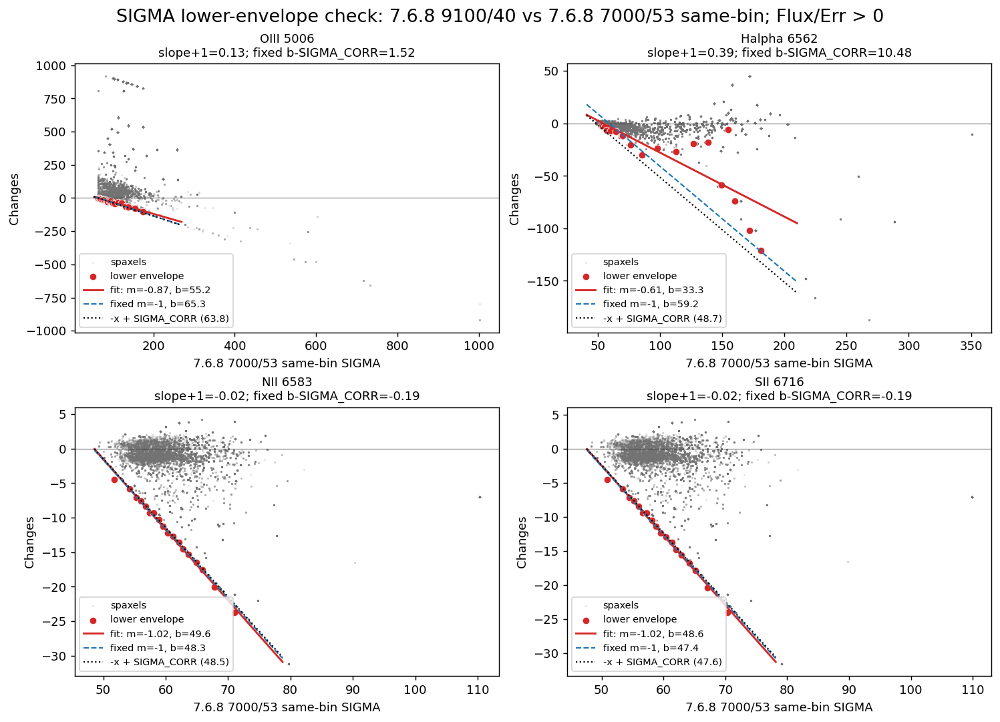

In [18]:
def plot_sigma_boundary_verification(snr_cut=0, max_points=25000, random_state=210):
    fig, axes = plt.subplots(2, 2, figsize=(11.4, 8.2), squeeze=False, constrained_layout=True)
    fig.suptitle(
        f'SIGMA lower-envelope check: {RUNS[COMPARE_RUN]["plot_label"]} vs {RUNS[BASELINE_RUN]["plot_label"]}; {cut_label(snr_cut)}',
        fontsize=15,
    )

    for ax, line in zip(axes.ravel(), LINE_ORDER):
        x, y, _ = pair_arrays(line, 'SIGMA', snr_cut)
        residual = residual_values(x, y, 'SIGMA')
        finite = np.isfinite(x) & np.isfinite(y) & np.isfinite(residual)
        x = x[finite]
        y = y[finite]
        residual = residual[finite]
        if x.size == 0:
            ax.set_title(f'{LINE_LABELS[line]}: no valid spaxels')
            continue

        px, pres = sample_for_plot(x, residual, max_points=max_points, random_state=random_state)
        ax.scatter(px, pres, s=3, alpha=0.18, linewidths=0, color='0.45', label='spaxels')

        env_x, env_y, env_n = lower_envelope_points(x, residual)
        if env_x.size:
            ax.scatter(env_x, env_y, s=35, color='tab:red', edgecolor='white', linewidth=0.5, label='lower envelope')

        xx = np.linspace(*robust_limits(x, p=(1, 99)), 100)
        row = sigma_boundary_record(line, snr_cut)
        if np.isfinite(row['envelope_slope']) and np.isfinite(row['envelope_intercept']):
            ax.plot(
                xx,
                row['envelope_slope'] * xx + row['envelope_intercept'],
                color='tab:red',
                linewidth=1.6,
                label=f"fit: m={row['envelope_slope']:.2f}, b={row['envelope_intercept']:.1f}",
            )
        if np.isfinite(row['fixed_slope_minus1_intercept']):
            ax.plot(
                xx,
                -xx + row['fixed_slope_minus1_intercept'],
                color='tab:blue',
                linewidth=1.2,
                linestyle='--',
                label=f"fixed m=-1, b={row['fixed_slope_minus1_intercept']:.1f}",
            )
        if np.isfinite(row['sigma_corr_hdu_median']):
            ax.plot(
                xx,
                -xx + row['sigma_corr_hdu_median'],
                color='black',
                linewidth=1.2,
                linestyle=':',
                label=f"-x + SIGMA_CORR ({row['sigma_corr_hdu_median']:.1f})",
            )

        ax.axhline(0, color='0.2', linestyle='-', linewidth=0.7, alpha=0.55)
        ax.set_xlabel(f'{RUNS[BASELINE_RUN]["plot_label"]} SIGMA')
        ax.set_ylabel('Changes')
        ax.set_title(
            f'{LINE_LABELS[line]}\n'
            f"slope+1={row['slope_plus_one']:.2f}; fixed b-SIGMA_CORR={row['fixed_intercept_minus_sigma_corr_hdu']:.2f}",
            fontsize=10,
        )
        ax.legend(loc='lower left', fontsize=8, frameon=True)

    plt.show()


SIGMA_BOUNDARY_PLOT_CUT = 0
plot_sigma_boundary_verification(SIGMA_BOUNDARY_PLOT_CUT)


## Observation And Interpretation

Use this section after execution to compare against the 0507 PDF. Because the reference now uses the exact same binning as `7.6.8 9100/40`, any remaining trends should be less contaminated by bin-layout differences.

Read the key numbers from `compact_cut_summary`, then use `OIII SIGMA Ratio And Log-Scale Focus` for the OIII-specific log/ratio view:

- `median_residual_compare_minus_reference` gives the systematic offset in each residual panel.
- `robust_sigma_residual` gives the scatter to quote for the trumpet plots.
- `median_ratio_compare_over_reference` and `median_log10_ratio` are useful for `FLUX` and especially `SIGMA`, where a roughly constant multiplicative offset is easier to see in ratio/log space.

For `SIGMA`, compare `sigma_boundary_summary` to the old 0507 result. A `slope_plus_one` value near zero still supports a `-1` lower envelope. If the same-binning run reduces the broad scatter but leaves the systematic ratio/offset, that points more toward the VELSCALE/LSF sampling change than toward binning.


## Optional Save


In [19]:
# no_cut_summary.to_csv('IC3392_9100_40_vs_7000_samebinning_no_fluxerr_cut_summary_20260509.csv', index=False)
# cut_summary.to_csv('IC3392_9100_40_vs_7000_samebinning_fluxerr_cut_summary_20260509.csv', index=False)
# sigma_boundary_summary.to_csv('IC3392_9100_40_vs_7000_samebinning_sigma_boundary_summary_20260509.csv', index=False)
